In [1]:
#import libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
import datetime as dt
import plotly.express as px
import plotly.graph_objects as go
%matplotlib inline

from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer

import warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 50)
from IPython.display import display
plt.rcParams['figure.figsize']=(10,5)
plt.rcParams['figure.dpi']=300
sns.set_theme(style='darkgrid',palette="turbo_r")
%matplotlib inline

pd.set_option('display.max_columns', None)
import datetime

In [2]:
df = pd.read_excel('marketing_campaign (1).xlsx')
df

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,2014-02-10,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,2014-01-19,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,3,11,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,10870,1967,Graduation,Married,61223.0,0,1,2013-06-13,46,709,43,182,42,118,247,2,9,3,4,5,0,0,0,0,0,0,3,11,0
2236,4001,1946,PhD,Together,64014.0,2,1,2014-06-10,56,406,0,30,0,0,8,7,8,2,5,7,0,0,0,1,0,0,3,11,0
2237,7270,1981,Graduation,Divorced,56981.0,0,0,2014-01-25,91,908,48,217,32,12,24,1,2,3,13,6,0,1,0,0,0,0,3,11,0
2238,8235,1956,Master,Together,69245.0,0,1,2014-01-24,8,428,30,214,80,30,61,2,6,5,10,3,0,0,0,0,0,0,3,11,0


In [3]:
df.drop(columns=['ID'], inplace=True)
df

,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,3,11,1
1,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,3,11,0
2,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,3,11,0
3,1984,Graduation,Together,26646.0,1,0,2014-02-10,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,3,11,0
4,1981,PhD,Married,58293.0,1,0,2014-01-19,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,3,11,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,1967,Graduation,Married,61223.0,0,1,2013-06-13,46,709,43,182,42,118,247,2,9,3,4,5,0,0,0,0,0,0,3,11,0
2236,1946,PhD,Together,64014.0,2,1,2014-06-10,56,406,0,30,0,0,8,7,8,2,5,7,0,0,0,1,0,0,3,11,0
2237,1981,Graduation,Divorced,56981.0,0,0,2014-01-25,91,908,48,217,32,12,24,1,2,3,13,6,0,1,0,0,0,0,3,11,0
2238,1956,Master,Together,69245.0,0,1,2014-01-24,8,428,30,214,80,30,61,2,6,5,10,3,0,0,0,0,0,0,3,11,0


Examing 'MARKETING DATA'


(2240, 28)

Index(['Year_Birth', 'Education', 'Marital_Status', 'Income', 'Kidhome',
       'Teenhome', 'Dt_Customer', 'Recency', 'MntWines', 'MntFruits',
       'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1',
       'AcceptedCmp2', 'Complain', 'Z_CostContact', 'Z_Revenue', 'Response'],
      dtype='object')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 28 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   Year_Birth           2240 non-null   int64         
 1   Education            2240 non-null   object        
 2   Marital_Status       2240 non-null   object        
 3   Income               2216 non-null   float64       
 4   Kidhome              2240 non-null   int64         
 5   Teenhome             2240 non-null   int64         
 6   Dt_Customer          2240 non-null   datetime64[ns]
 7   Recency              2240 non-null   int64         
 8   MntWines             2240 non-null   int64         
 9   MntFruits            2240 non-null   int64         
 10  MntMeatProducts      2240 non-null   int64         
 11  MntFishProducts      2240 non-null   int64         
 12  MntSweetProducts     2240 non-null   int64         
 13  MntGoldProds         2240 non-nul

None

Year_Birth               59
Education                 5
Marital_Status            8
Income                 1974
Kidhome                   3
Teenhome                  3
Dt_Customer             663
Recency                 100
MntWines                776
MntFruits               158
MntMeatProducts         558
MntFishProducts         182
MntSweetProducts        177
MntGoldProds            213
NumDealsPurchases        15
NumWebPurchases          15
NumCatalogPurchases      14
NumStorePurchases        14
NumWebVisitsMonth        16
AcceptedCmp3              2
AcceptedCmp4              2
AcceptedCmp5              2
AcceptedCmp1              2
AcceptedCmp2              2
Complain                  2
Z_CostContact             1
Z_Revenue                 1
Response                  2
dtype: int64

,count,mean,std,min,25%,50%,75%,max
Year_Birth,2240.0,1968.805804,11.984069,1893.0,1959.00,1970.0,1977.00,1996.0
Income,2216.0,52247.251354,25173.076661,1730.0,35303.00,51381.5,68522.00,666666.0
Kidhome,2240.0,0.444196,0.538398,0.0,0.00,0.0,1.00,2.0
Teenhome,2240.0,0.506250,0.544538,0.0,0.00,0.0,1.00,2.0
Recency,2240.0,49.109375,28.962453,0.0,24.00,49.0,74.00,99.0
MntWines,2240.0,303.935714,336.597393,0.0,23.75,173.5,504.25,1493.0
MntFruits,2240.0,26.302232,39.773434,0.0,1.00,8.0,33.00,199.0
MntMeatProducts,2240.0,166.950000,225.715373,0.0,16.00,67.0,232.00,1725.0
MntFishProducts,2240.0,37.525446,54.628979,0.0,3.00,12.0,50.00,259.0
MntSweetProducts,2240.0,27.062946,41.280498,0.0,1.00,8.0,33.00,263.0


182Duplicate


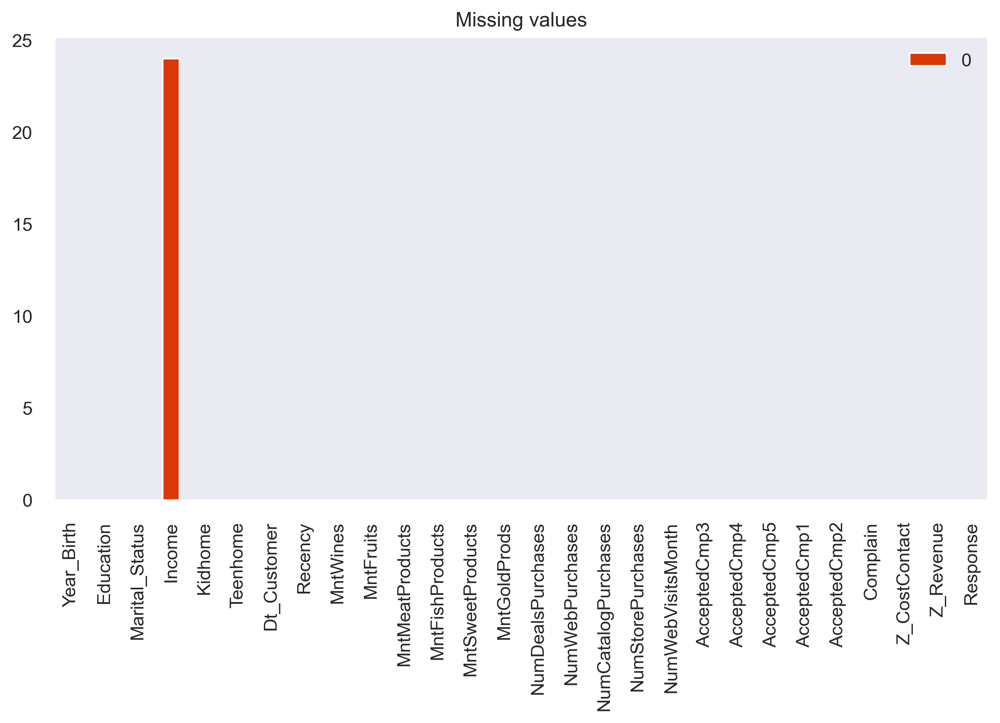

In [4]:
def examine_data(data, data_name='data'):
    print(f"Examing '{data_name}'")
    display(df.shape)
    display(df.columns)
    display(df.info())
    display(df.nunique())
    display(df.describe().transpose())
    
examine_data(df, data_name= 'MARKETING DATA')

# duplicate values
duplicate= df.duplicated().sum()
if duplicate == 0:
    print('No duplicate in the dataset')
else:
    print(f'{duplicate}Duplicate')
    
# missing values
missing= pd.DataFrame(round(df.isna().sum()))
if missing[0].sum() > 0:
        missing.plot(kind='bar')
        plt.title('Missing values')
        plt.grid()
else:
    print(f'There are no missing values in df.') 

In [5]:
current_year = datetime.datetime.now().year

df['Age'] = current_year - df['Year_Birth']
df

,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,Age
0,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,3,11,1,67
1,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,3,11,0,70
2,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,3,11,0,59
3,1984,Graduation,Together,26646.0,1,0,2014-02-10,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,3,11,0,40
4,1981,PhD,Married,58293.0,1,0,2014-01-19,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,3,11,0,43
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,1967,Graduation,Married,61223.0,0,1,2013-06-13,46,709,43,182,42,118,247,2,9,3,4,5,0,0,0,0,0,0,3,11,0,57
2236,1946,PhD,Together,64014.0,2,1,2014-06-10,56,406,0,30,0,0,8,7,8,2,5,7,0,0,0,1,0,0,3,11,0,78
2237,1981,Graduation,Divorced,56981.0,0,0,2014-01-25,91,908,48,217,32,12,24,1,2,3,13,6,0,1,0,0,0,0,3,11,0,43
2238,1956,Master,Together,69245.0,0,1,2014-01-24,8,428,30,214,80,30,61,2,6,5,10,3,0,0,0,0,0,0,3,11,0,68


In [6]:
df.drop(columns=['Year_Birth'], inplace=True)
df

,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,Age
0,Graduation,Single,58138.0,0,0,2012-09-04,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,3,11,1,67
1,Graduation,Single,46344.0,1,1,2014-03-08,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,3,11,0,70
2,Graduation,Together,71613.0,0,0,2013-08-21,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,3,11,0,59
3,Graduation,Together,26646.0,1,0,2014-02-10,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,3,11,0,40
4,PhD,Married,58293.0,1,0,2014-01-19,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,3,11,0,43
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,Graduation,Married,61223.0,0,1,2013-06-13,46,709,43,182,42,118,247,2,9,3,4,5,0,0,0,0,0,0,3,11,0,57
2236,PhD,Together,64014.0,2,1,2014-06-10,56,406,0,30,0,0,8,7,8,2,5,7,0,0,0,1,0,0,3,11,0,78
2237,Graduation,Divorced,56981.0,0,0,2014-01-25,91,908,48,217,32,12,24,1,2,3,13,6,0,1,0,0,0,0,3,11,0,43
2238,Master,Together,69245.0,0,1,2014-01-24,8,428,30,214,80,30,61,2,6,5,10,3,0,0,0,0,0,0,3,11,0,68


In [7]:
current_date = datetime.datetime.now()

df['Days_Since_Enrollment'] = (current_date - df['Dt_Customer']).dt.days
df.drop(columns=['Dt_Customer'], inplace=True)
df

,Education,Marital_Status,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,Age,Days_Since_Enrollment
0,Graduation,Single,58138.0,0,0,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,3,11,1,67,4356
1,Graduation,Single,46344.0,1,1,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,3,11,0,70,3806
2,Graduation,Together,71613.0,0,0,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,3,11,0,59,4005
3,Graduation,Together,26646.0,1,0,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,3,11,0,40,3832
4,PhD,Married,58293.0,1,0,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,3,11,0,43,3854
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,Graduation,Married,61223.0,0,1,46,709,43,182,42,118,247,2,9,3,4,5,0,0,0,0,0,0,3,11,0,57,4074
2236,PhD,Together,64014.0,2,1,56,406,0,30,0,0,8,7,8,2,5,7,0,0,0,1,0,0,3,11,0,78,3712
2237,Graduation,Divorced,56981.0,0,0,91,908,48,217,32,12,24,1,2,3,13,6,0,1,0,0,0,0,3,11,0,43,3848
2238,Master,Together,69245.0,0,1,8,428,30,214,80,30,61,2,6,5,10,3,0,0,0,0,0,0,3,11,0,68,3849


In [8]:
# total number of kids
df['Kids'] = df['Kidhome'] + df['Teenhome']

In [9]:
# total product purchased
df['Total_expense'] = df['MntWines'] + df['MntFruits'] + df['MntMeatProducts'] + df['MntFishProducts']
+ df['MntSweetProducts']  + df['MntGoldProds']

0       176
1         7
2        63
3         8
4        42
       ... 
2235    365
2236      8
2237     36
2238     91
2239     22
Length: 2240, dtype: int64

In [10]:
# total accepted campaign
df['TotalAcceptedCmp'] = df['AcceptedCmp3'] + df['AcceptedCmp1'] + df['AcceptedCmp2'] + df['AcceptedCmp4'] 
+ df['AcceptedCmp5']

0       0
1       0
2       0
3       0
4       0
       ..
2235    0
2236    0
2237    0
2238    0
2239    0
Name: AcceptedCmp5, Length: 2240, dtype: int64

In [11]:
# total method of purchase
df['TotalNumOfPurchase'] = df['NumWebPurchases'] + df['NumCatalogPurchases'] + df['NumStorePurchases']
+ df['NumDealsPurchases']

0       3
1       2
2       1
3       2
4       5
       ..
2235    2
2236    7
2237    1
2238    2
2239    3
Name: NumDealsPurchases, Length: 2240, dtype: int64

In [12]:
# delete some redundant columns to reduce complexity of model
df.drop(['Z_CostContact','Z_Revenue','Kidhome','Teenhome','AcceptedCmp3','AcceptedCmp1','AcceptedCmp2',
'AcceptedCmp4','AcceptedCmp5','NumWebPurchases','NumCatalogPurchases','NumStorePurchases','NumDealsPurchases',
'NumWebVisitsMonth','MntWines','MntFruits','MntMeatProducts','MntFishProducts','MntSweetProducts','MntGoldProds'],axis=1, inplace=True)

In [13]:
df

,Education,Marital_Status,Income,Recency,Complain,Response,Age,Days_Since_Enrollment,Kids,Total_expense,TotalAcceptedCmp,TotalNumOfPurchase
0,Graduation,Single,58138.0,58,0,1,67,4356,0,1441,0,22
1,Graduation,Single,46344.0,38,0,0,70,3806,2,20,0,4
2,Graduation,Together,71613.0,26,0,0,59,4005,0,713,0,20
3,Graduation,Together,26646.0,26,0,0,40,3832,1,45,0,6
4,PhD,Married,58293.0,94,0,0,43,3854,1,380,0,14
...,...,...,...,...,...,...,...,...,...,...,...,...
2235,Graduation,Married,61223.0,46,0,0,57,4074,1,976,0,16
2236,PhD,Together,64014.0,56,0,0,78,3712,3,436,1,15
2237,Graduation,Divorced,56981.0,91,0,0,43,3848,0,1205,1,18
2238,Master,Together,69245.0,8,0,0,68,3849,1,752,0,21


In [14]:
print('Total categories in the feature marital status:\n', df['Marital_Status'].value_counts(),'\n')
print('Total categories in the feature education:\n', df.Education.value_counts())

# replace values in column to a more precised category for 'marital_status'
df['Marital_Status']=df['Marital_Status'].replace(['Married', 'Together'],'In relationship')
df['Marital_Status']=df['Marital_Status'].replace(['Single','Divorced','Widow','Alone','YOLO', 'Absurd'],'Single')
df['Marital_Status'].value_counts()

# replace values in column to a more precised category for 'education'
df.Education =df.Education.replace(['Graduation','PhD','Master','2n Cycle'],'PG')
df.Education =df.Education.replace(['Basic'],'UG')

df

Total categories in the feature marital status:
 Married     864
Together    580
Single      480
Divorced    232
Widow        77
Alone         3
Absurd        2
YOLO          2
Name: Marital_Status, dtype: int64 

Total categories in the feature education:
 Graduation    1127
PhD            486
Master         370
2n Cycle       203
Basic           54
Name: Education, dtype: int64


,Education,Marital_Status,Income,Recency,Complain,Response,Age,Days_Since_Enrollment,Kids,Total_expense,TotalAcceptedCmp,TotalNumOfPurchase
0,PG,Single,58138.0,58,0,1,67,4356,0,1441,0,22
1,PG,Single,46344.0,38,0,0,70,3806,2,20,0,4
2,PG,In relationship,71613.0,26,0,0,59,4005,0,713,0,20
3,PG,In relationship,26646.0,26,0,0,40,3832,1,45,0,6
4,PG,In relationship,58293.0,94,0,0,43,3854,1,380,0,14
...,...,...,...,...,...,...,...,...,...,...,...,...
2235,PG,In relationship,61223.0,46,0,0,57,4074,1,976,0,16
2236,PG,In relationship,64014.0,56,0,0,78,3712,3,436,1,15
2237,PG,Single,56981.0,91,0,0,43,3848,0,1205,1,18
2238,PG,In relationship,69245.0,8,0,0,68,3849,1,752,0,21


In [15]:
fig = px.bar(df, x= 'Total_expense', y= 'Marital_Status', color = 'Education', barmode='group')
fig.update_layout(width=800, height=400, title='Marital Status vs Education ')
fig.show()

Observation:

- Categorising Customers in relationship and PG school - group1
- Categorising Customers in relationship and UG school - group2
- Categorising Customers that're Single and PG school - group3
- Categorising Customers that're Single and UG school- group4
The chart shows that customers in group1 patronise the business more than group3 while group2 and group4 are insignificant customers, the company can reduce its cost by not concentrating on markerting to this set of insignificant customers.

In [16]:
fig = px.pie(df, names= 'Marital_Status', title= 'Marital Status')
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

- 64% of our customers are in a In relationship
- 35% of our customers are Single

In [17]:
fig = px.pie(df, names= 'Education', title= 'Education',hover_data=['Total_expense'])
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

- 97% of our customers are PG student, they also purchase from the store better compared to UG student

In [18]:
#Creating dummy vairables dropping first dummy variable

df=pd.get_dummies(df,columns=['Education','Marital_Status'])
df

,Income,Recency,Complain,Response,Age,Days_Since_Enrollment,Kids,Total_expense,TotalAcceptedCmp,TotalNumOfPurchase,Education_PG,Education_UG,Marital_Status_In relationship,Marital_Status_Single
0,58138.0,58,0,1,67,4356,0,1441,0,22,1,0,0,1
1,46344.0,38,0,0,70,3806,2,20,0,4,1,0,0,1
2,71613.0,26,0,0,59,4005,0,713,0,20,1,0,1,0
3,26646.0,26,0,0,40,3832,1,45,0,6,1,0,1,0
4,58293.0,94,0,0,43,3854,1,380,0,14,1,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,61223.0,46,0,0,57,4074,1,976,0,16,1,0,1,0
2236,64014.0,56,0,0,78,3712,3,436,1,15,1,0,1,0
2237,56981.0,91,0,0,43,3848,0,1205,1,18,1,0,0,1
2238,69245.0,8,0,0,68,3849,1,752,0,21,1,0,1,0


# missing value check

In [19]:
df.isnull().sum()#income has some null values

Income                            24
Recency                            0
Complain                           0
Response                           0
Age                                0
Days_Since_Enrollment              0
Kids                               0
Total_expense                      0
TotalAcceptedCmp                   0
TotalNumOfPurchase                 0
Education_PG                       0
Education_UG                       0
Marital_Status_In relationship     0
Marital_Status_Single              0
dtype: int64

In [20]:
df['Income'].fillna(0, inplace=True)

In [21]:
df.isnull().sum()#no null values

Income                            0
Recency                           0
Complain                          0
Response                          0
Age                               0
Days_Since_Enrollment             0
Kids                              0
Total_expense                     0
TotalAcceptedCmp                  0
TotalNumOfPurchase                0
Education_PG                      0
Education_UG                      0
Marital_Status_In relationship    0
Marital_Status_Single             0
dtype: int64

# duplicate values

In [22]:
df.duplicated().sum()

185

In [23]:
# print duplicated values
df[df.duplicated()]

,Income,Recency,Complain,Response,Age,Days_Since_Enrollment,Kids,Total_expense,TotalAcceptedCmp,TotalNumOfPurchase,Education_PG,Education_UG,Marital_Status_In relationship,Marital_Status_Single
83,38620.0,56,0,0,61,4107,0,207,0,10,1,0,1,0
179,78497.0,44,0,0,73,3903,0,755,1,24,1,0,1,0
281,51369.0,84,0,0,48,4305,1,383,0,14,1,0,1,0
282,37760.0,20,0,0,78,4360,0,277,0,11,1,0,1,0
363,37717.0,31,0,0,46,4276,1,19,0,3,1,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2218,22775.0,40,0,0,46,4068,1,14,0,3,1,0,1,0
2221,75777.0,12,0,1,42,4053,0,1345,1,20,1,0,0,1
2225,58554.0,55,0,0,56,4334,2,498,0,16,1,0,1,0
2234,34421.0,81,0,0,50,4056,1,19,0,3,1,0,1,0


In [24]:
df[(df['Income']==38620.0) & (df['Recency']==56)]

,Income,Recency,Complain,Response,Age,Days_Since_Enrollment,Kids,Total_expense,TotalAcceptedCmp,TotalNumOfPurchase,Education_PG,Education_UG,Marital_Status_In relationship,Marital_Status_Single
31,38620.0,56,0,0,61,4107,0,207,0,10,1,0,1,0
83,38620.0,56,0,0,61,4107,0,207,0,10,1,0,1,0


In [25]:
#drop duplicated records
df.drop_duplicates(inplace=True)

In [26]:
df.duplicated().sum()#no duplicated values

0

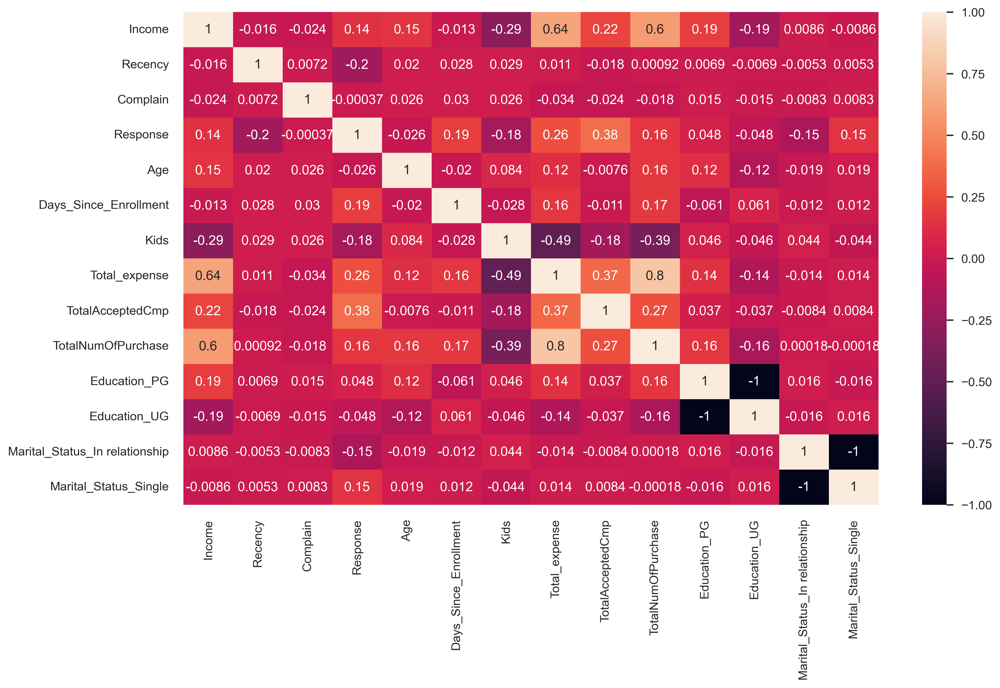

In [27]:
# correlation between feature column
df.corr()
plt.figure(figsize=(14,8))
sns.heatmap(df.corr(), annot= True);

In [28]:
df.shape

(2055, 14)

In [29]:
def examine_data(data, data_name='data'):
    print(f"Examing '{data_name}'")
    display(df.shape)
    display(df.columns)
    display(df.info())
    display(df.nunique())
    display(df.describe().transpose())
    
examine_data(df, data_name= 'MARKETING DATA')

# duplicate values
duplicate= df.duplicated().sum()
if duplicate == 0:
    print('No duplicate in the dataset')
else:
    print(f'{duplicate}Duplicate')
    
# missing values
missing= pd.DataFrame(round(df.isna().sum()))
if missing[0].sum() > 0:
        missing.plot(kind='bar')
        plt.title('Missing values')
        plt.grid()
else:
    print(f'There are no missing values in df.') 

Examing 'MARKETING DATA'


(2055, 14)

Index(['Income', 'Recency', 'Complain', 'Response', 'Age',
       'Days_Since_Enrollment', 'Kids', 'Total_expense', 'TotalAcceptedCmp',
       'TotalNumOfPurchase', 'Education_PG', 'Education_UG',
       'Marital_Status_In relationship', 'Marital_Status_Single'],
      dtype='object')

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2055 entries, 0 to 2239
Data columns (total 14 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Income                          2055 non-null   float64
 1   Recency                         2055 non-null   int64  
 2   Complain                        2055 non-null   int64  
 3   Response                        2055 non-null   int64  
 4   Age                             2055 non-null   int64  
 5   Days_Since_Enrollment           2055 non-null   int64  
 6   Kids                            2055 non-null   int64  
 7   Total_expense                   2055 non-null   int64  
 8   TotalAcceptedCmp                2055 non-null   int64  
 9   TotalNumOfPurchase              2055 non-null   int64  
 10  Education_PG                    2055 non-null   uint8  
 11  Education_UG                    2055 non-null   uint8  
 12  Marital_Status_In relationship  20

None

Income                            1975
Recency                            100
Complain                             2
Response                             2
Age                                 59
Days_Since_Enrollment              663
Kids                                 4
Total_expense                      957
TotalAcceptedCmp                     4
TotalNumOfPurchase                  33
Education_PG                         2
Education_UG                         2
Marital_Status_In relationship       2
Marital_Status_Single                2
dtype: int64

,count,mean,std,min,25%,50%,75%,max
Income,2055.0,51765.099757,26006.578961,0.0,34831.0,51267.0,68277.5,666666.0
Recency,2055.0,48.998054,28.989942,0.0,24.0,49.0,74.0,99.0
Complain,2055.0,0.009732,0.098195,0.0,0.0,0.0,0.0,1.0
Response,2055.0,0.151338,0.358465,0.0,0.0,0.0,0.0,1.0
Age,2055.0,55.226277,11.974408,28.0,47.0,54.0,65.0,131.0
Days_Since_Enrollment,2055.0,4045.635036,201.997817,3693.0,3872.0,4045.0,4221.0,4392.0
Kids,2055.0,0.954258,0.748806,0.0,0.0,1.0,1.0,3.0
Total_expense,2055.0,535.747445,553.882285,3.0,50.0,328.0,920.5,2343.0
TotalAcceptedCmp,2055.0,0.228224,0.526773,0.0,0.0,0.0,0.0,3.0
TotalNumOfPurchase,2055.0,12.536253,7.189772,0.0,6.0,12.0,18.0,32.0


No duplicate in the dataset
There are no missing values in df.


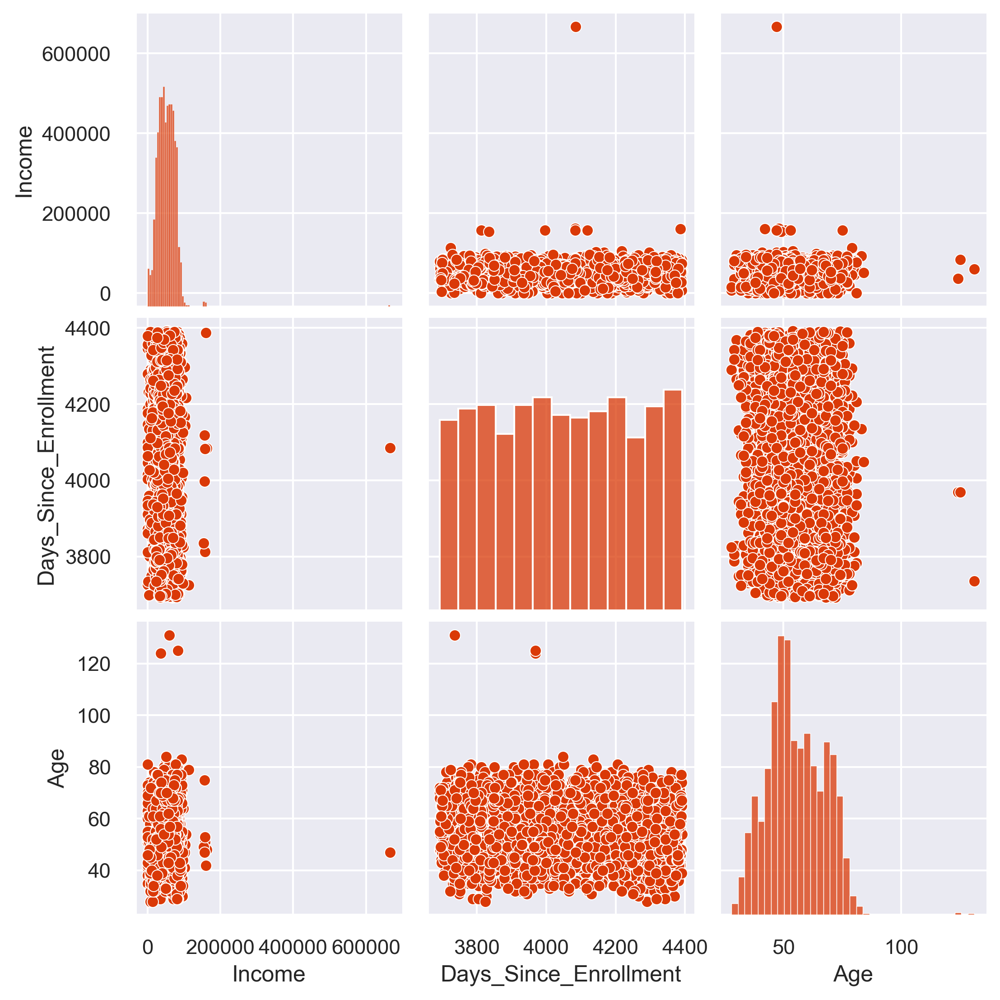

In [30]:
sns.pairplot(df, vars= ['Income','Days_Since_Enrollment','Age'])
plt.show();

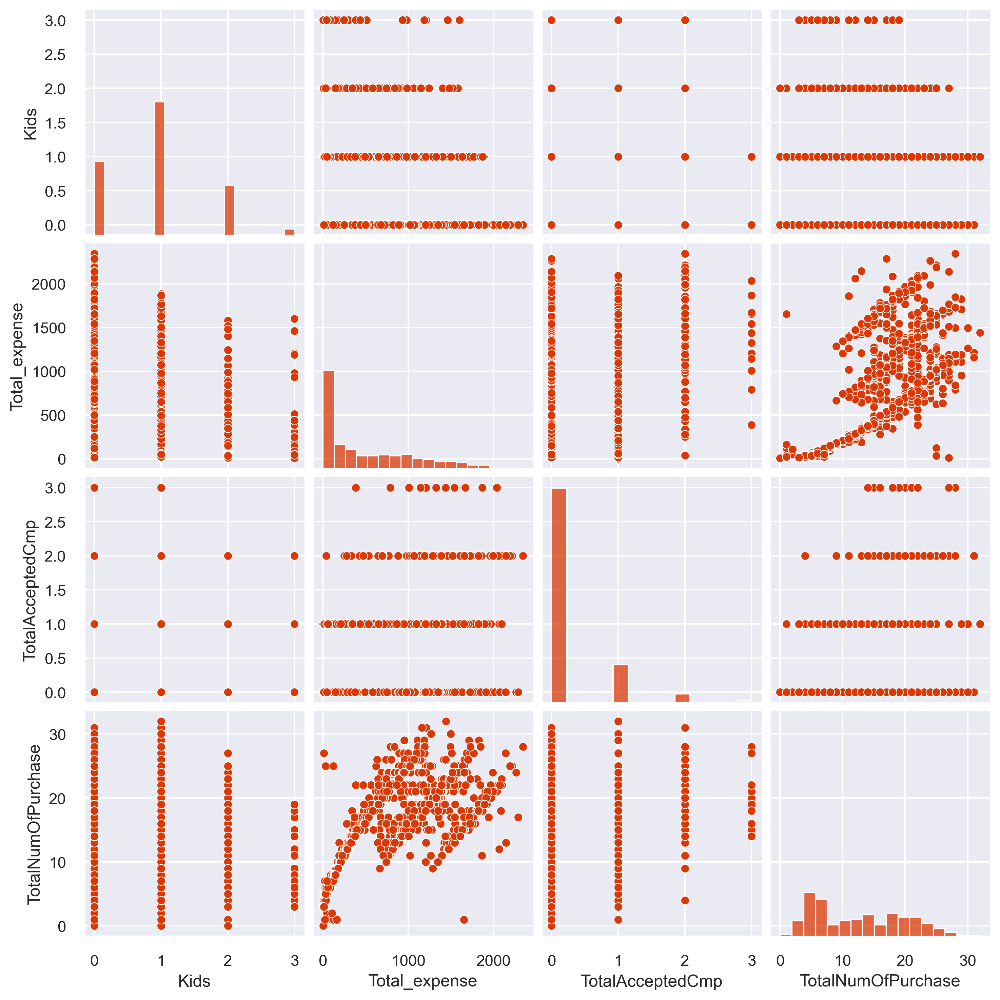

In [31]:
sns.pairplot(df, vars= ['Kids','Total_expense','TotalAcceptedCmp','TotalNumOfPurchase'])
plt.show();

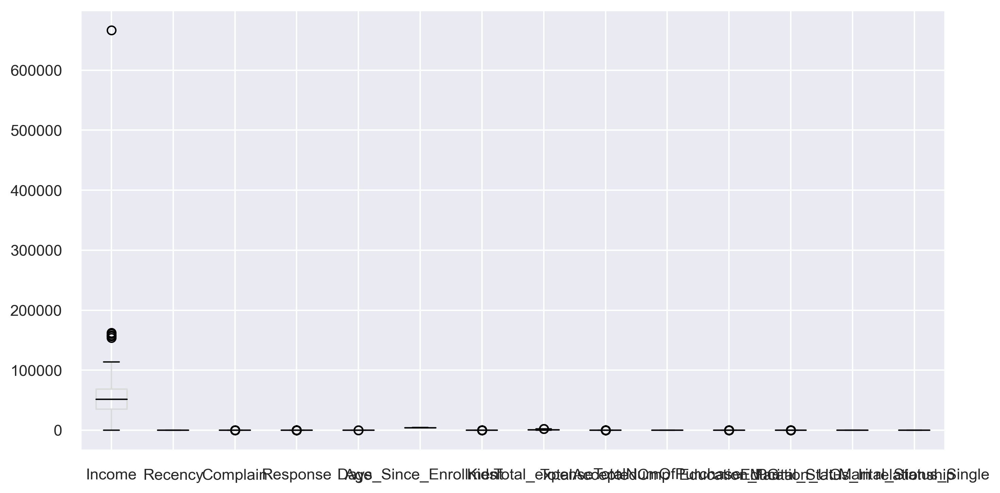

In [32]:
df.boxplot()#lots of noise(outliers)
plt.tight_layout()

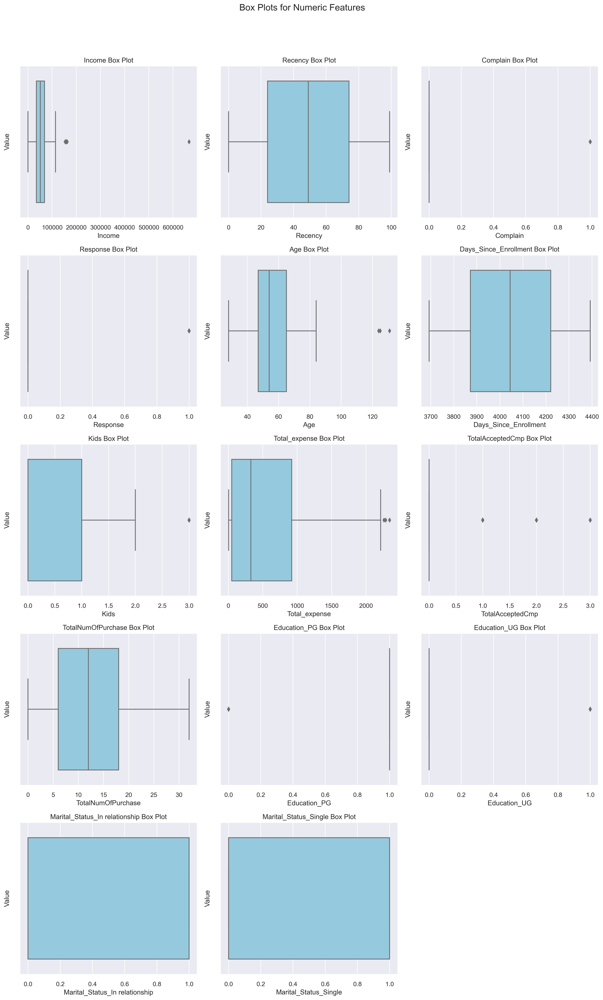

In [33]:
#Box plot for every feature
numeric_columns = df.select_dtypes(include=['number'])

# Set up subplots
num_features = len(numeric_columns.columns)
num_rows = (num_features + 2) // 3  # Adjust the number of rows as desired
fig, axes = plt.subplots(num_rows, 3, figsize=(15, 5 * num_rows))
fig.suptitle("Box Plots for Numeric Features", fontsize=16)

# Create individual box plots
for i, col in enumerate(numeric_columns.columns):
    row, col_num = divmod(i, 3)
    ax = axes[row, col_num]
    sns.boxplot(x=col, data=df, ax=ax, color='skyblue')
    ax.set_title(f"{col} Box Plot")
    ax.set_xlabel(col)
    ax.set_ylabel("Value")

# Hide empty subplots (if any)
for i in range(num_features, num_rows * 3):
    fig.delaxes(axes.flatten()[i])

plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust subplot spacing
plt.show()

In [34]:
# outlier detection function(creating function)

In [35]:
def outlier_detection(data, colname):
    q1 = data[colname].quantile(0.25)
    q3 = data[colname].quantile(0.75)
    iqr = q3 - q1
    
    lower = q1 - (1.5 * iqr)
    upper = q3 + (1.5 * iqr)
    
    return lower, upper

for column in df.columns:
    lower_limit, upper_limit = outlier_detection(df, column)
    print(f"Column: {column}, Lower Limit: {lower_limit:.2f}, Upper Limit: {upper_limit:.2f}")

Column: Income, Lower Limit: -15338.75, Upper Limit: 118447.25
Column: Recency, Lower Limit: -51.00, Upper Limit: 149.00
Column: Complain, Lower Limit: 0.00, Upper Limit: 0.00
Column: Response, Lower Limit: 0.00, Upper Limit: 0.00
Column: Age, Lower Limit: 20.00, Upper Limit: 92.00
Column: Days_Since_Enrollment, Lower Limit: 3348.50, Upper Limit: 4744.50
Column: Kids, Lower Limit: -1.50, Upper Limit: 2.50
Column: Total_expense, Lower Limit: -1255.75, Upper Limit: 2226.25
Column: TotalAcceptedCmp, Lower Limit: 0.00, Upper Limit: 0.00
Column: TotalNumOfPurchase, Lower Limit: -12.00, Upper Limit: 36.00
Column: Education_PG, Lower Limit: 1.00, Upper Limit: 1.00
Column: Education_UG, Lower Limit: 0.00, Upper Limit: 0.00
Column: Marital_Status_In relationship, Lower Limit: -1.50, Upper Limit: 2.50
Column: Marital_Status_Single, Lower Limit: -1.50, Upper Limit: 2.50


In [36]:
#removing outliers and making it in a copied dateset df(with outliers),df1(without ouliers)

In [37]:
df_new=df.copy()

In [38]:
df1=df.copy()

In [39]:
for column in df1[['Income', 'Age']]:
    lower_limit, upper_limit = outlier_detection(df1, column)
    df1[column] = df1[column].clip(lower=int(lower_limit), upper=int(upper_limit))

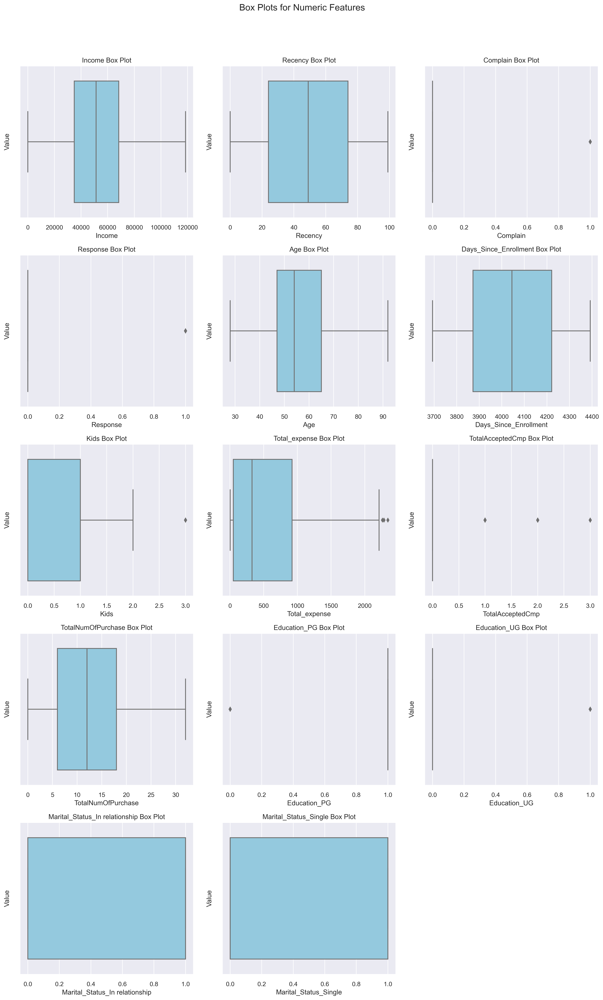

In [40]:
#Box plot for every feature
numeric_columns = df1.select_dtypes(include=['number'])

# Set up subplots
num_features = len(numeric_columns.columns)
num_rows = (num_features + 2) // 3  # Adjust the number of rows as desired
fig, axes = plt.subplots(num_rows, 3, figsize=(15, 5 * num_rows))
fig.suptitle("Box Plots for Numeric Features", fontsize=16)

# Create individual box plots
for i, col in enumerate(numeric_columns.columns):
    row, col_num = divmod(i, 3)
    ax = axes[row, col_num]
    sns.boxplot(x=col, data=df1, ax=ax, color='skyblue')
    ax.set_title(f"{col} Box Plot")
    ax.set_xlabel(col)
    ax.set_ylabel("Value")

# Hide empty subplots (if any)
for i in range(num_features, num_rows * 3):
    fig.delaxes(axes.flatten()[i])

plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust subplot spacing
plt.show()

In [41]:
df_hc=df1.copy()
df_kmeans=df1.copy()
df_dbscan=df1.copy()

In [42]:
from sklearn.preprocessing import StandardScaler

In [43]:
sc=StandardScaler()

In [44]:
scaled_data_outliers_free=pd.DataFrame(sc.fit_transform(df1),columns=df1.columns)

In [45]:
scaled_data_with_outliers=pd.DataFrame(sc.fit_transform(df),columns=df.columns)

In [46]:
x=scaled_data_outliers_free.copy()
x

,Income,Recency,Complain,Response,Age,Days_Since_Enrollment,Kids,Total_expense,TotalAcceptedCmp,TotalNumOfPurchase,Education_PG,Education_UG,Marital_Status_In relationship,Marital_Status_Single
0,0.312256,0.310595,-0.099136,2.368062,1.007198,1.536851,-1.274682,1.634775,-0.433355,1.316600,0.15629,-0.15629,-1.334461,1.334461
1,-0.231364,-0.379467,-0.099136,-0.422286,1.262738,-1.186614,1.396885,-0.931377,-0.433355,-1.187566,0.15629,-0.15629,-1.334461,1.334461
2,0.933358,-0.793505,-0.099136,-0.422286,0.325757,-0.201215,-1.274682,0.320096,-0.433355,1.038359,0.15629,-0.15629,0.749367,-0.749367
3,-1.139302,-0.793505,-0.099136,-0.422286,-1.292665,-1.057868,0.061102,-0.886230,-0.433355,-0.909326,0.15629,-0.15629,0.749367,-0.749367
4,0.319400,1.552707,-0.099136,-0.422286,-1.037125,-0.948929,0.061102,-0.281261,-0.433355,0.203637,0.15629,-0.15629,0.749367,-0.749367
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2050,3.092073,-0.897014,-0.099136,-0.422286,-0.696404,0.194926,0.061102,-0.879006,-0.433355,-0.770205,0.15629,-0.15629,0.749367,-0.749367
2051,0.454452,-0.103442,-0.099136,-0.422286,0.155397,0.140456,0.061102,0.795042,-0.433355,0.481878,0.15629,-0.15629,0.749367,-0.749367
2052,0.258926,1.449198,-0.099136,-0.422286,-1.037125,-0.978640,-1.274682,1.208588,1.465460,0.760118,0.15629,-0.15629,-1.334461,1.334461
2053,0.824210,-1.414561,-0.099136,-0.422286,1.092378,-0.973688,0.061102,0.390526,-0.433355,1.177479,0.15629,-0.15629,0.749367,-0.749367


In [47]:
scaled_data_with_outliers

,Income,Recency,Complain,Response,Age,Days_Since_Enrollment,Kids,Total_expense,TotalAcceptedCmp,TotalNumOfPurchase,Education_PG,Education_UG,Marital_Status_In relationship,Marital_Status_Single
0,0.245109,0.310595,-0.099136,2.368062,0.983480,1.536851,-1.274682,1.634775,-0.433355,1.316600,0.15629,-0.15629,-1.334461,1.334461
1,-0.208502,-0.379467,-0.099136,-0.422286,1.234075,-1.186614,1.396885,-0.931377,-0.433355,-1.187566,0.15629,-0.15629,-1.334461,1.334461
2,0.763373,-0.793505,-0.099136,-0.422286,0.315226,-0.201215,-1.274682,0.320096,-0.433355,1.038359,0.15629,-0.15629,0.749367,-0.749367
3,-0.966110,-0.793505,-0.099136,-0.422286,-1.271878,-1.057868,0.061102,-0.886230,-0.433355,-0.909326,0.15629,-0.15629,0.749367,-0.749367
4,0.251071,1.552707,-0.099136,-0.422286,-1.021282,-0.948929,0.061102,-0.281261,-0.433355,0.203637,0.15629,-0.15629,0.749367,-0.749367
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2050,23.649807,-0.897014,-0.099136,-0.422286,-0.687155,0.194926,0.061102,-0.879006,-0.433355,-0.770205,0.15629,-0.15629,0.749367,-0.749367
2051,0.363762,-0.103442,-0.099136,-0.422286,0.148162,0.140456,0.061102,0.795042,-0.433355,0.481878,0.15629,-0.15629,0.749367,-0.749367
2052,0.200610,1.449198,-0.099136,-0.422286,-1.021282,-0.978640,-1.274682,1.208588,1.465460,0.760118,0.15629,-0.15629,-1.334461,1.334461
2053,0.672297,-1.414561,-0.099136,-0.422286,1.067012,-0.973688,0.061102,0.390526,-0.433355,1.177479,0.15629,-0.15629,0.749367,-0.749367


In [48]:
x.columns

Index(['Income', 'Recency', 'Complain', 'Response', 'Age',
       'Days_Since_Enrollment', 'Kids', 'Total_expense', 'TotalAcceptedCmp',
       'TotalNumOfPurchase', 'Education_PG', 'Education_UG',
       'Marital_Status_In relationship', 'Marital_Status_Single'],
      dtype='object')

# hierarchical clustering

In [49]:
from scipy.cluster import hierarchy

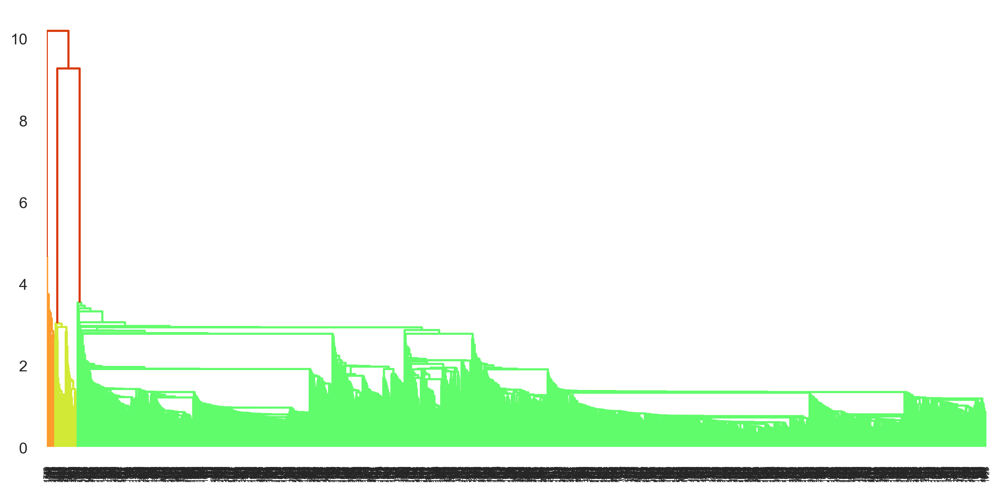

In [50]:
#single linkage
lk=hierarchy.linkage(x,method='single')
dendrogram=hierarchy.dendrogram(lk)
plt.tight_layout()

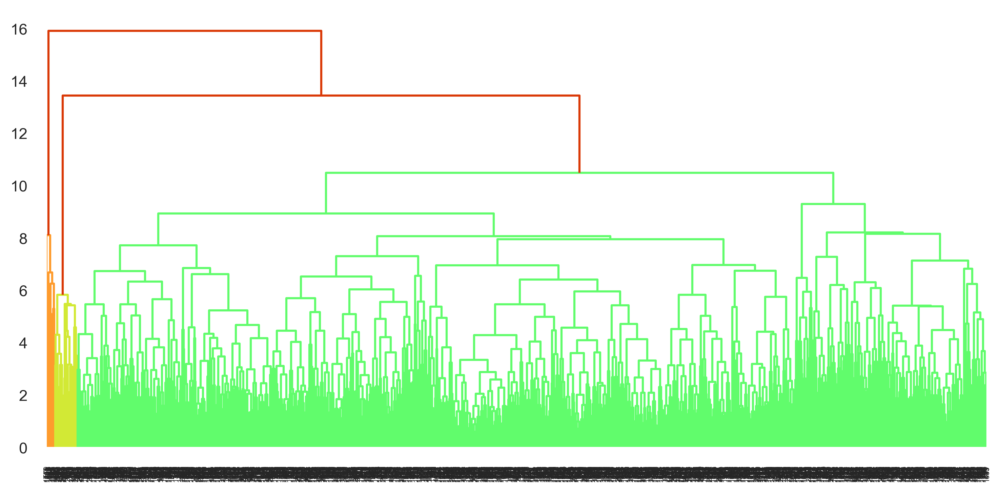

In [51]:
#Complete linkage
lk=hierarchy.linkage(x,method='complete')
dendrogram=hierarchy.dendrogram(lk)
plt.tight_layout()

In [52]:
#hyperparameter tuning

In [53]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score as sil


n_clusters = [2,3,4,5,6,7,8,9,10]  # always start number from 2.

for n_clusters in n_clusters:
    for linkages in ["ward", "average", "single", "complete"]:
        hie_cluster1 = AgglomerativeClustering(n_clusters=n_clusters,linkage=linkages) # bydefault it takes linkage 'ward'
        hie_labels1 = hie_cluster1.fit_predict(df)
        silhouette_score1 = sil(df, hie_labels1)
        print("For n_clusters =", n_clusters,"The average silhouette_score with linkage-",linkages, ':',silhouette_score1)
    print()

For n_clusters = 2 The average silhouette_score with linkage- ward : 0.5875288747730053
For n_clusters = 2 The average silhouette_score with linkage- average : 0.9587144282551998
For n_clusters = 2 The average silhouette_score with linkage- single : 0.9587144282551998
For n_clusters = 2 The average silhouette_score with linkage- complete : 0.9587144282551998

For n_clusters = 3 The average silhouette_score with linkage- ward : 0.5931506904658538
For n_clusters = 3 The average silhouette_score with linkage- average : 0.6886471023224492
For n_clusters = 3 The average silhouette_score with linkage- single : 0.7593166740972028
For n_clusters = 3 The average silhouette_score with linkage- complete : 0.5824002761391746

For n_clusters = 4 The average silhouette_score with linkage- ward : 0.5120007745005483
For n_clusters = 4 The average silhouette_score with linkage- average : 0.4673739538583057
For n_clusters = 4 The average silhouette_score with linkage- single : 0.5486049375410965
For n_c

In [54]:
#choosing optimal value

hc=AgglomerativeClustering(n_clusters=3,linkage='complete')
yp_HC=hc.fit_predict(x)
yp_HC
df_hc['Cluster_HC']=yp_HC

df_hc

,Income,Recency,Complain,Response,Age,Days_Since_Enrollment,Kids,Total_expense,TotalAcceptedCmp,TotalNumOfPurchase,Education_PG,Education_UG,Marital_Status_In relationship,Marital_Status_Single,Cluster_HC
0,58138.0,58,0,1,67,4356,0,1441,0,22,1,0,0,1,0
1,46344.0,38,0,0,70,3806,2,20,0,4,1,0,0,1,0
2,71613.0,26,0,0,59,4005,0,713,0,20,1,0,1,0,0
3,26646.0,26,0,0,40,3832,1,45,0,6,1,0,1,0,0
4,58293.0,94,0,0,43,3854,1,380,0,14,1,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2233,118447.0,23,0,0,47,4085,1,49,0,7,1,0,1,0,0
2235,61223.0,46,0,0,57,4074,1,976,0,16,1,0,1,0,0
2237,56981.0,91,0,0,43,3848,0,1205,1,18,1,0,0,1,0
2238,69245.0,8,0,0,68,3849,1,752,0,21,1,0,1,0,0


In [55]:
df_hc.groupby('Cluster_HC').agg('mean')

,Income,Recency,Complain,Response,Age,Days_Since_Enrollment,Kids,Total_expense,TotalAcceptedCmp,TotalNumOfPurchase,Education_PG,Education_UG,Marital_Status_In relationship,Marital_Status_Single
Cluster_HC,,,,,,,,,,,,,,
0,52197.973817,49.008560,0.0,0.154079,55.381672,4043.093152,0.957704,549.683283,0.232628,12.728600,1.0,0.0,0.641994,0.358006
1,45554.500000,51.100000,1.0,0.150000,56.750000,4106.350000,1.150000,345.550000,0.100000,11.200000,1.0,0.0,0.600000,0.400000
2,19913.346939,47.714286,0.0,0.040816,46.183673,4123.877551,0.734694,48.551020,0.102041,5.285714,0.0,1.0,0.591837,0.408163


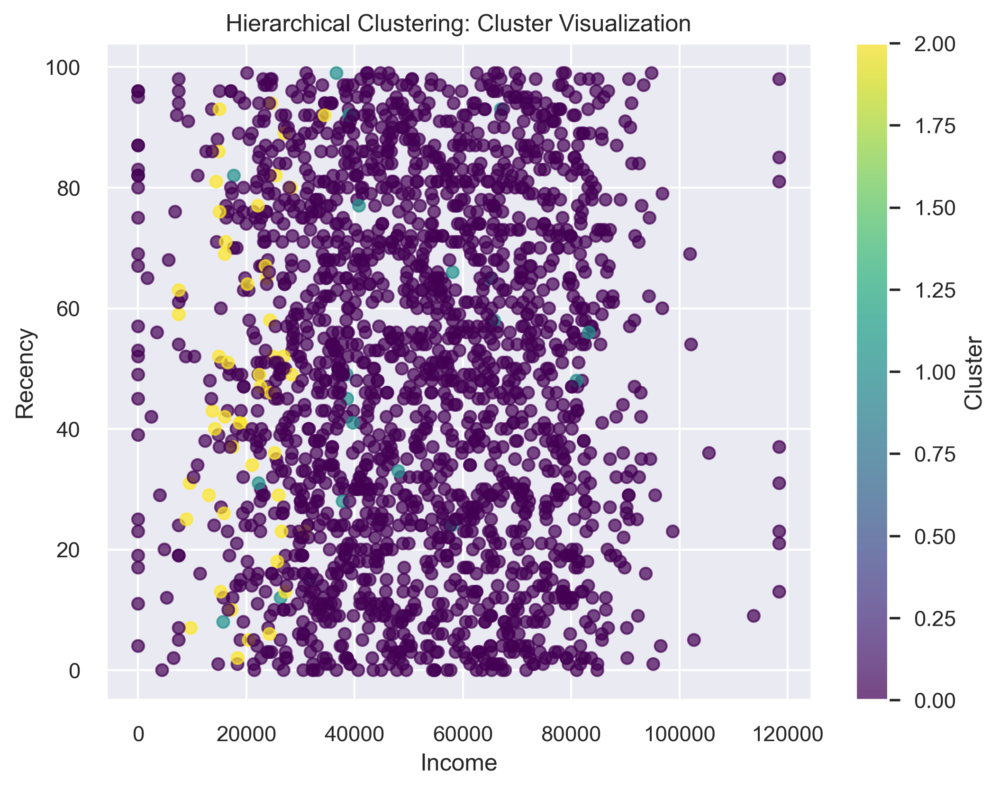

In [56]:
import matplotlib.pyplot as plt

feature1 = 'Income'
feature2 = 'Recency'

plt.figure(figsize=(8, 6))
plt.scatter(df1[feature1], df1[feature2], c=yp_HC, cmap='viridis', alpha=0.7)
plt.xlabel(feature1)
plt.ylabel(feature2)
plt.title("Hierarchical Clustering: Cluster Visualization")
plt.colorbar(label="Cluster")
plt.show()


In [57]:
#silhouette_score
sil(x,yp_HC)

0.5711496025483833

# K-means clustering

In [58]:
from sklearn.cluster import KMeans 
km=KMeans()

In [59]:
wcss=[]

for i in range(1,11):
    km=KMeans(n_clusters=i)
    km.fit_predict(x)
    wcss.append(km.inertia_)

Text(0.5, 1.0, 'Elbow Graph')

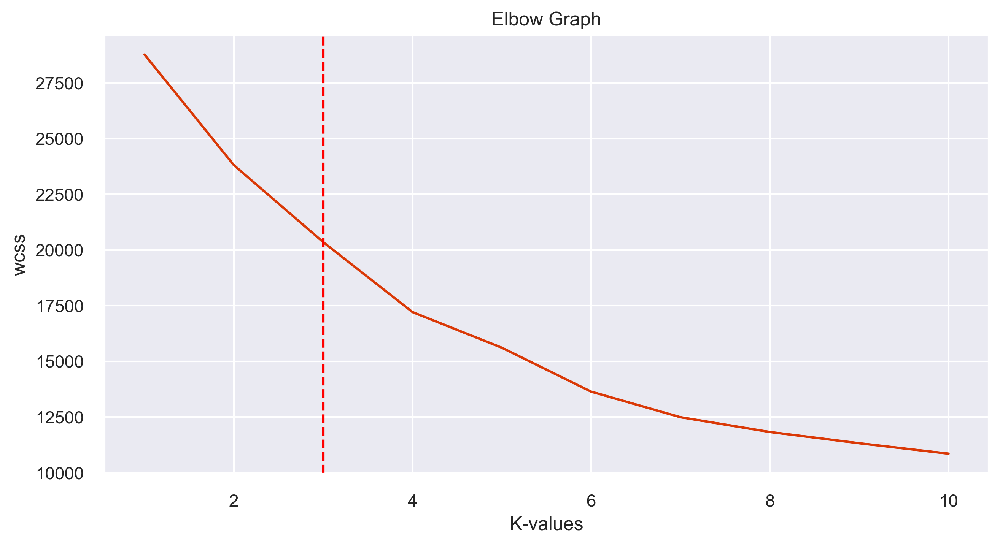

In [60]:
plt.plot(range(1,11),wcss)#elbow looks to be bending at 3 lets see the silhouette_score
plt.axvline(x=3,linestyle='--',color='red')
plt.xlabel('K-values')
plt.ylabel('wcss')
plt.title('Elbow Graph')

In [61]:
#Kmeans model
km=KMeans(n_clusters=3)
ypred_kmeans=km.fit_predict(x)
ypred_kmeans

array([1, 0, 1, ..., 1, 1, 0])

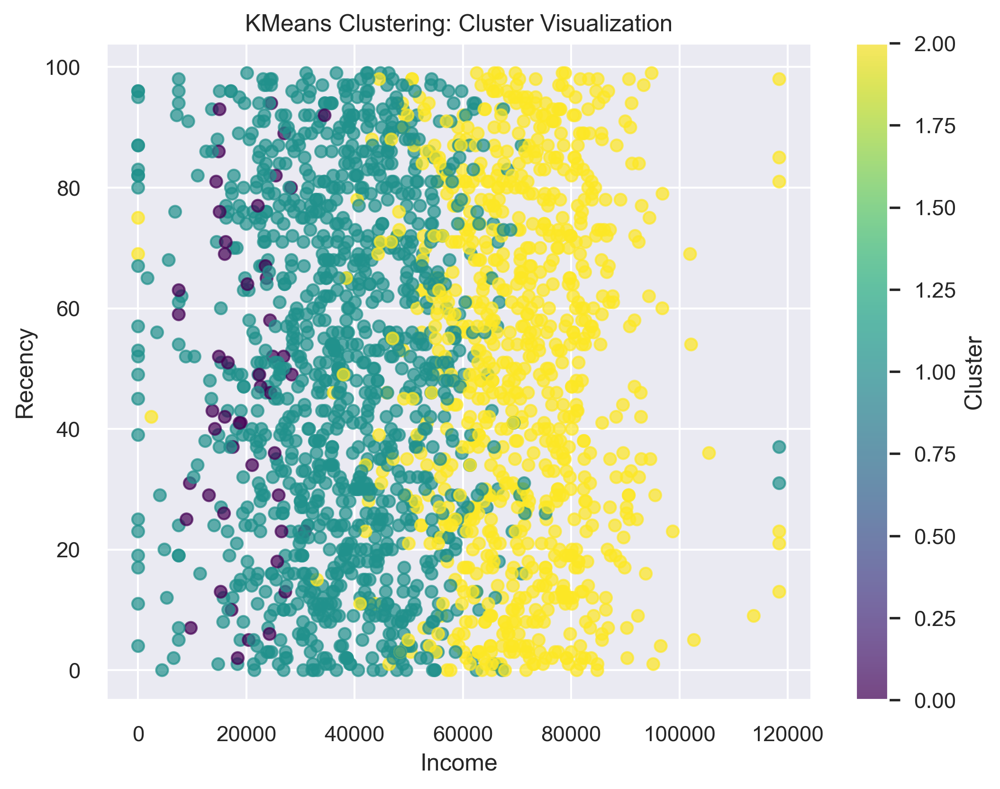

In [62]:
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

feature1 = 'Income'
feature2 = 'Recency'

# Initialize KMeans with the desired number of clusters (3 in your case)
km = KMeans(n_clusters=3)
ypred_kmeans = km.fit_predict(x)

plt.figure(figsize=(8, 6))
plt.scatter(df1[feature1], df1[feature2], c=ypred_kmeans, cmap='viridis', alpha=0.7)
plt.xlabel(feature1)
plt.ylabel(feature2)
plt.title("KMeans Clustering: Cluster Visualization")
plt.colorbar(label="Cluster")
plt.show()

In [63]:
#silhouette_score
sil(x,ypred_kmeans)

0.21366226630132742

In [64]:
df_kmeans['cluster_kmeans']=ypred_kmeans
df_kmeans.groupby('cluster_kmeans').agg('mean')

,Income,Recency,Complain,Response,Age,Days_Since_Enrollment,Kids,Total_expense,TotalAcceptedCmp,TotalNumOfPurchase,Education_PG,Education_UG,Marital_Status_In relationship,Marital_Status_Single
cluster_kmeans,,,,,,,,,,,,,,
0,19913.346939,47.714286,0.000000,0.040816,46.183673,4123.877551,0.734694,48.551020,0.102041,5.285714,0.0,1.0,0.591837,0.408163
1,37865.240071,48.982348,0.011474,0.090026,53.811121,4021.945278,1.291262,142.480141,0.083848,7.571933,1.0,0.0,0.665490,0.334510
2,70647.135166,49.090493,0.008018,0.237113,57.451317,4071.988545,0.529210,1073.484536,0.422680,19.386025,1.0,0.0,0.610538,0.389462


In [65]:
# DBSCAN Clustering

In [66]:
from sklearn.cluster import DBSCAN

In [67]:
db=DBSCAN(eps=0.5,min_samples=3)

In [68]:
y_dbscan=db.fit_predict(x)
y_dbscan

array([-1, -1, -1, ..., -1, -1, -1], dtype=int64)

In [69]:
sil(x,y_dbscan)#sil score is negative not good

-0.378765567641215

In [70]:
# finding out the best eps value(k-dist plot)

Text(0.5, 1.0, 'K-Distance Graph')

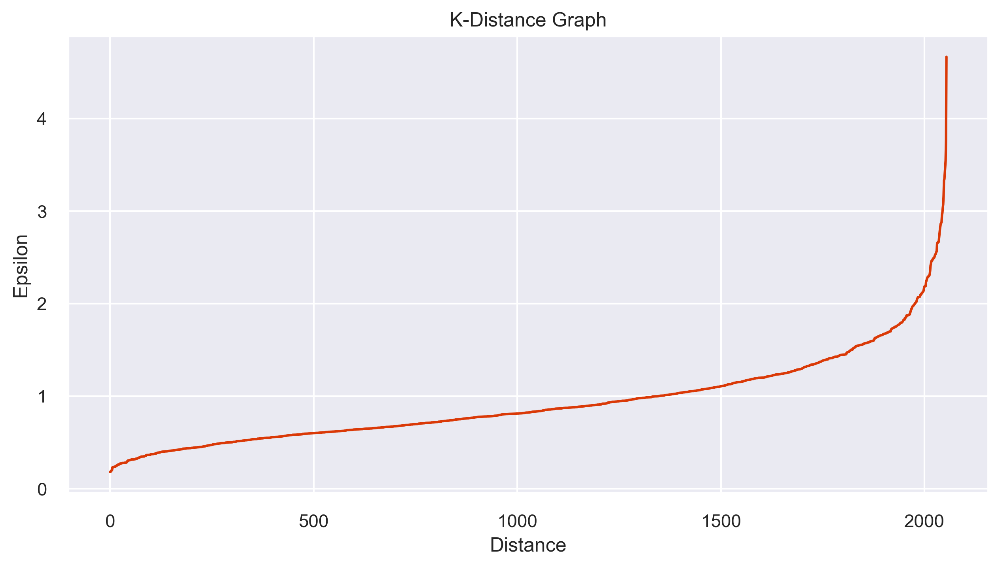

In [71]:
from sklearn.neighbors import NearestNeighbors
neigh=NearestNeighbors(n_neighbors=3).fit(x)
d,indexe = neigh.kneighbors(x)
distance=np.sort(d[:,1])
plt.plot(distance)
plt.xlabel('Distance')
plt.ylabel('Epsilon')
plt.title('K-Distance Graph')

In [72]:
db1 = DBSCAN(eps=2,min_samples=3)
yp=db1.fit_predict(x)
yp

array([0, 1, 2, ..., 1, 2, 3], dtype=int64)

In [73]:
sil(x,yp)#sil score is improved lets increases the eps value and check its sil score

0.14742058676054715

In [74]:
db2 = DBSCAN(eps=2.2,min_samples=3)#sil has greatly increased but has only one culster
yp1=db2.fit_predict(x)
sil(x,yp1)

0.1829497177570561

selecting min_samples:
- No.of columns+1=37+1=38
- No.of columns+2
- No.of Dimensions+1
- Always keep min_samples atleast 3

In [75]:
db3 = DBSCAN(eps=2.2,min_samples=5)#sil has greatly increased but it has only one cluster
yp2=db3.fit_predict(x)
sil(x,yp2)

0.20506321792819035

In [76]:
yp

array([0, 1, 2, ..., 1, 2, 3], dtype=int64)

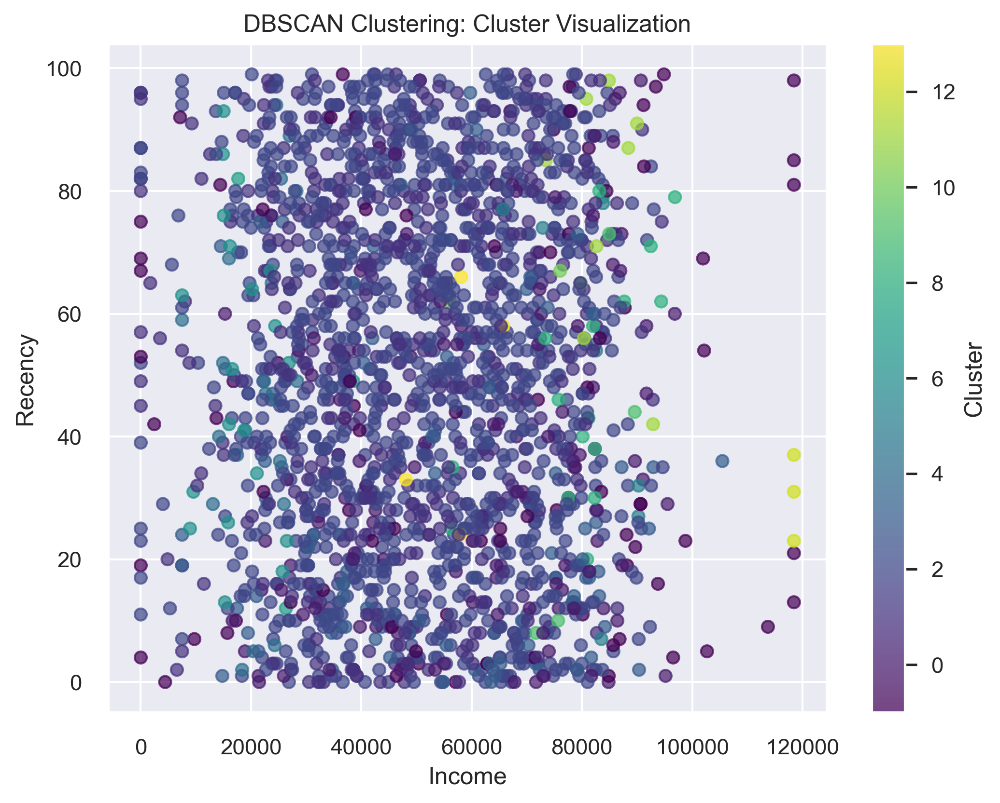

In [77]:
import matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score

feature1 = 'Income'
feature2 = 'Recency'

# Initialize DBSCAN with your chosen parameters (eps and min_samples)
db3 = DBSCAN(eps=2.2, min_samples=5)
yp2 = db3.fit_predict(x)

# Create a scatter plot
plt.figure(figsize=(8, 6))
plt.scatter(df1[feature1], df1[feature2], c=yp, cmap='viridis', alpha=0.7)
plt.xlabel(feature1)
plt.ylabel(feature2)
plt.title("DBSCAN Clustering: Cluster Visualization")
plt.colorbar(label="Cluster")
plt.show()


In [78]:
df_dbscan['Cluster_db']=yp2

In [79]:
df_dbscan[df_dbscan['Cluster_db']==-1]

,Income,Recency,Complain,Response,Age,Days_Since_Enrollment,Kids,Total_expense,TotalAcceptedCmp,TotalNumOfPurchase,Education_PG,Education_UG,Marital_Status_In relationship,Marital_Status_Single,Cluster_db
21,2447.0,42,0,0,45,4232,1,1728,0,28,1,0,1,0,-1
27,0.0,19,0,0,38,4187,1,12,0,27,1,0,0,1,-1
67,88194.0,19,0,1,45,3795,1,1212,2,31,1,0,0,1,-1
69,74854.0,90,0,0,54,4140,3,1460,0,12,1,0,1,0,-1
78,26326.0,12,1,0,48,3991,0,6,0,3,1,0,1,0,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2084,0.0,75,0,1,81,3935,0,1312,0,21,1,0,0,1,-1
2132,118447.0,85,0,0,75,3997,0,6,0,0,1,0,1,0,-1
2167,91172.0,94,0,1,34,4152,0,1008,3,14,1,0,0,1,-1
2228,0.0,53,0,0,46,4379,0,1653,1,1,1,0,1,0,-1


In [80]:
df_dbscan.groupby('Cluster_db').agg('mean')

,Income,Recency,Complain,Response,Age,Days_Since_Enrollment,Kids,Total_expense,TotalAcceptedCmp,TotalNumOfPurchase,Education_PG,Education_UG,Marital_Status_In relationship,Marital_Status_Single
Cluster_db,,,,,,,,,,,,,,
-1,60040.270270,45.932432,0.202703,0.432432,53.621622,4054.054054,0.837838,823.918919,1.081081,15.108108,0.918919,0.081081,0.5,0.5
0,60070.345070,36.436620,0.000000,1.000000,54.471831,4139.000000,0.563380,879.492958,0.485915,15.098592,1.000000,0.000000,0.0,1.0
1,49624.354898,53.073937,0.000000,0.000000,56.073937,4026.571165,1.005545,457.963031,0.109057,11.865065,1.000000,0.000000,0.0,1.0
2,50803.492363,50.888589,0.000000,0.000000,55.325247,4025.824798,1.023360,488.434861,0.149146,12.338724,1.000000,0.000000,1.0,0.0
3,58703.868613,32.569343,0.000000,1.000000,54.175182,4148.489051,0.722628,869.912409,0.678832,14.978102,1.000000,0.000000,1.0,0.0
4,21364.708333,46.833333,0.000000,0.000000,50.250000,4165.000000,0.583333,41.291667,0.083333,4.958333,0.000000,1.000000,1.0,0.0
5,17781.263158,49.157895,0.000000,0.000000,41.473684,4107.210526,1.000000,28.842105,0.000000,5.000000,0.000000,1.000000,0.0,1.0
6,58992.200000,49.200000,1.000000,0.000000,70.800000,4116.800000,0.800000,600.000000,0.000000,16.400000,1.000000,0.000000,1.0,0.0


In [81]:
from sklearn.metrics import silhouette_score

# Compute silhouette scores
silhouette_hc = silhouette_score(x, yp_HC)
silhouette_kmeans = silhouette_score(x, ypred_kmeans)
silhouette_dbscan = silhouette_score(x, yp2)

# Print the results
print(f"Silhouette Score (Hierarchical Clustering): {silhouette_hc:.4f}")
print(f"Silhouette Score (KMeans Clustering): {silhouette_kmeans:.4f}")
print(f"Silhouette Score (DBSCAN): {silhouette_dbscan:.4f}")

# Determine which method has the highest silhouette score
best_method = max(silhouette_hc, silhouette_kmeans, silhouette_dbscan)
if best_method == silhouette_hc:
    print("Hierarchical Clustering has the best silhouette score.")
elif best_method == silhouette_kmeans:
    print("KMeans Clustering has the best silhouette score.")
else:
    print("DBSCAN has the best silhouette score.")

Silhouette Score (Hierarchical Clustering): 0.5711
Silhouette Score (KMeans Clustering): 0.2137
Silhouette Score (DBSCAN): 0.2051
Hierarchical Clustering has the best silhouette score.


In [82]:
#classificaficatilon for hc

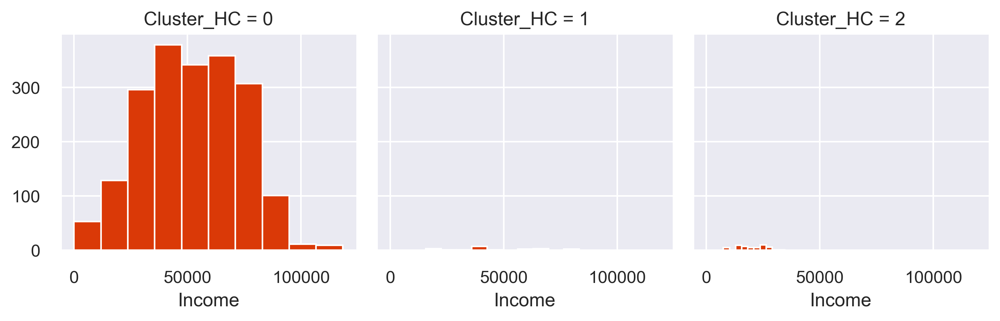

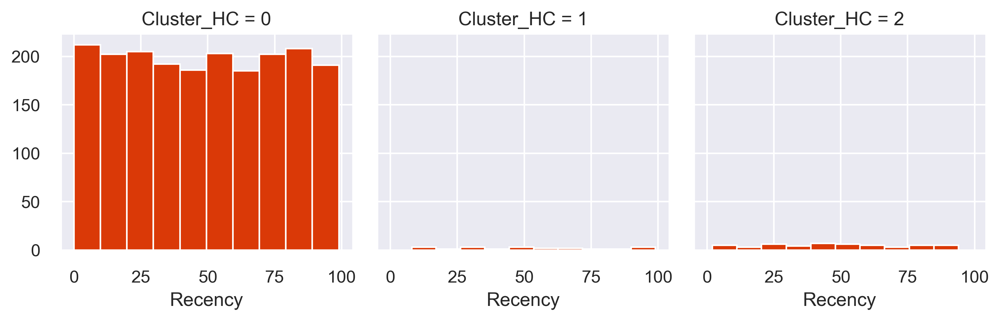

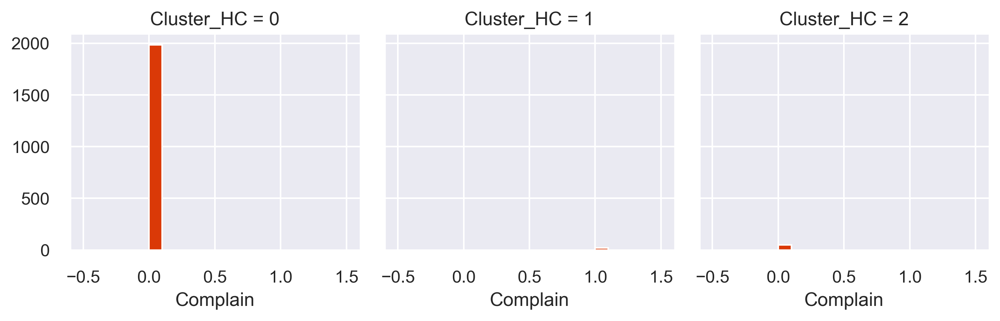

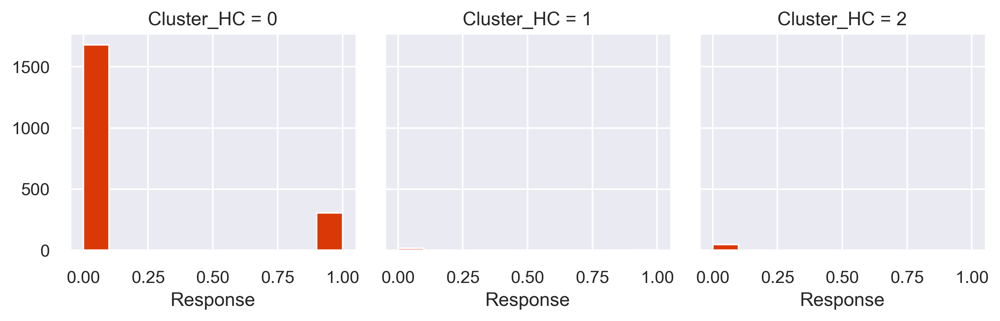

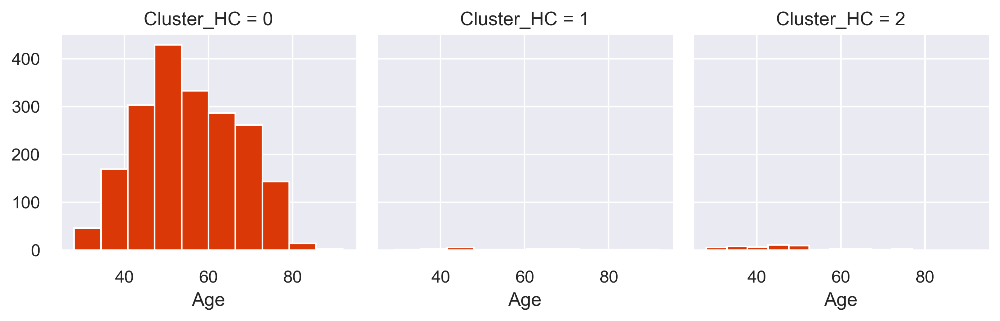

...

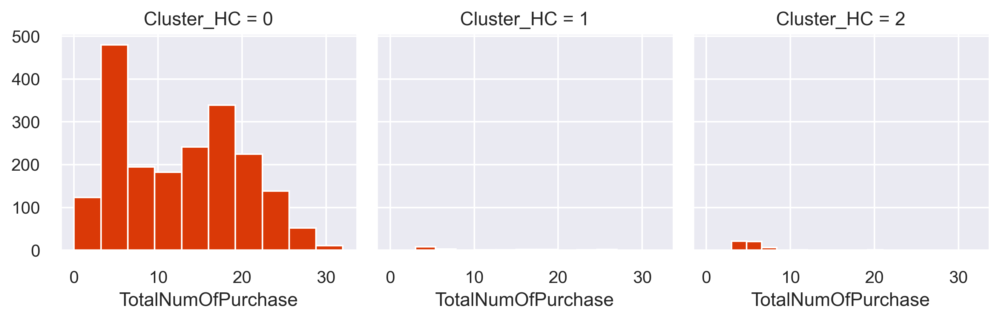

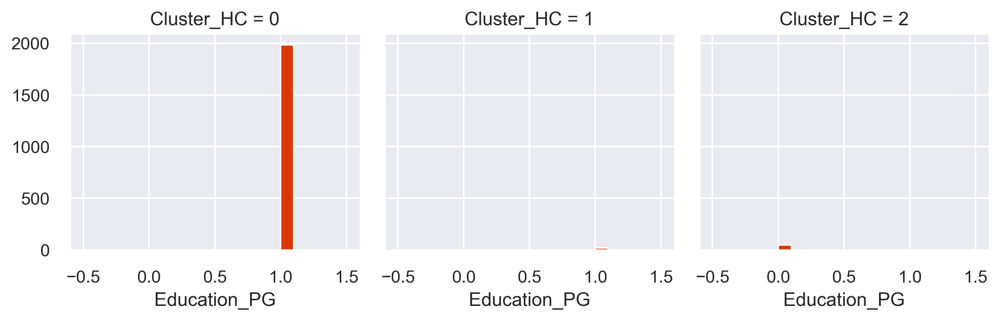

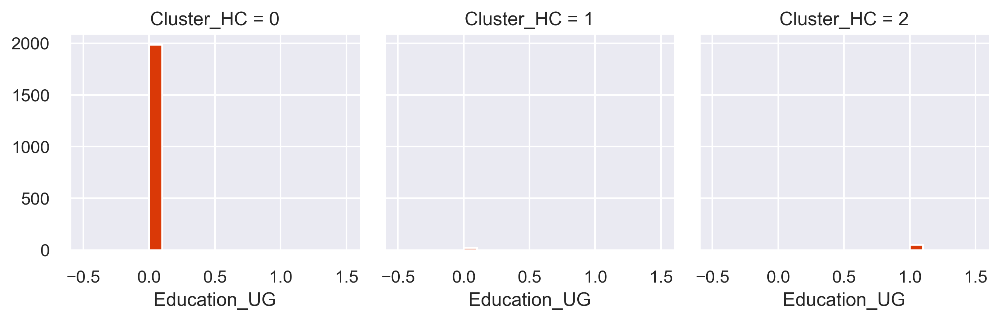

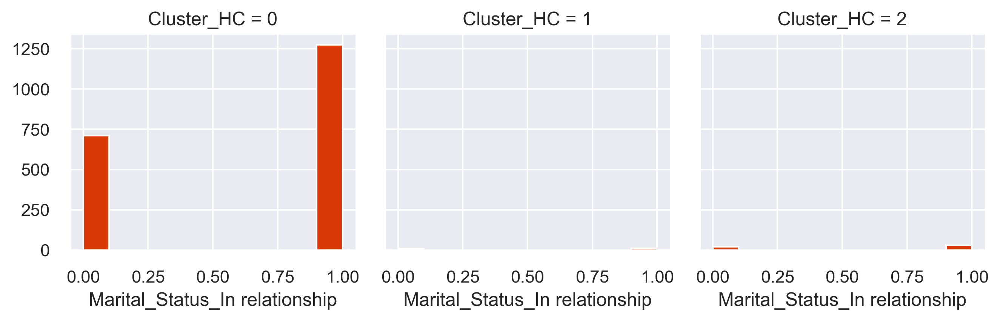

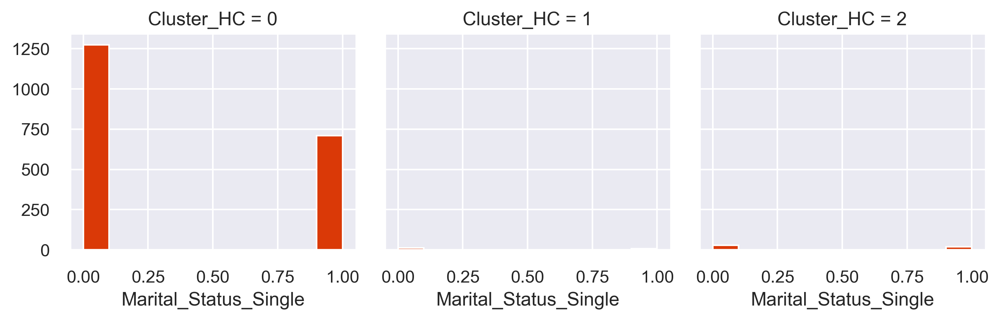

In [83]:
for c in df_hc.drop(['Cluster_HC'],axis=1):
    grid= sns.FacetGrid(df_hc, col='Cluster_HC')
    grid= grid.map(plt.hist, c)
plt.show()

In [84]:
#train test split

In [85]:
X = df_hc.drop(['Cluster_HC'],axis=1)
y= df_hc[['Cluster_HC']]
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33)

In [86]:
# decision tree 
from sklearn.tree import DecisionTreeClassifier
model_hc = DecisionTreeClassifier(criterion="entropy")
model_hc.fit(X_train, y_train)
y_pred_hc = model_hc.predict(X_test)
y_pred_hc

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0,
       0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

In [87]:
from sklearn.metrics import confusion_matrix, classification_report

# Assuming y_test and y_pred are already defined
print(confusion_matrix(y_test, y_pred_hc))
print(classification_report(y_test, y_pred_hc))

[[657   0   0]
 [  0   4   0]
 [  0   0  18]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       657
           1       1.00      1.00      1.00         4
           2       1.00      1.00      1.00        18

    accuracy                           1.00       679
   macro avg       1.00      1.00      1.00       679
weighted avg       1.00      1.00      1.00       679



In [88]:
#classificaficatilon for kmeans

In [89]:
df_kmeans.head()

,Income,Recency,Complain,Response,Age,Days_Since_Enrollment,Kids,Total_expense,TotalAcceptedCmp,TotalNumOfPurchase,Education_PG,Education_UG,Marital_Status_In relationship,Marital_Status_Single,cluster_kmeans
0,58138.0,58,0,1,67,4356,0,1441,0,22,1,0,0,1,2
1,46344.0,38,0,0,70,3806,2,20,0,4,1,0,0,1,1
2,71613.0,26,0,0,59,4005,0,713,0,20,1,0,1,0,2
3,26646.0,26,0,0,40,3832,1,45,0,6,1,0,1,0,1
4,58293.0,94,0,0,43,3854,1,380,0,14,1,0,1,0,1


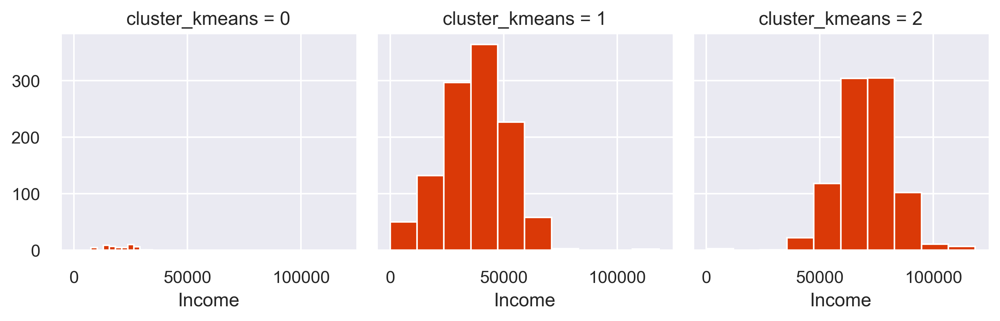

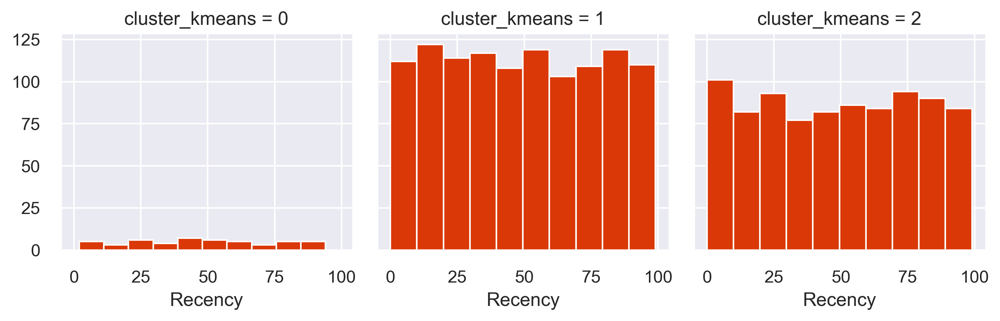

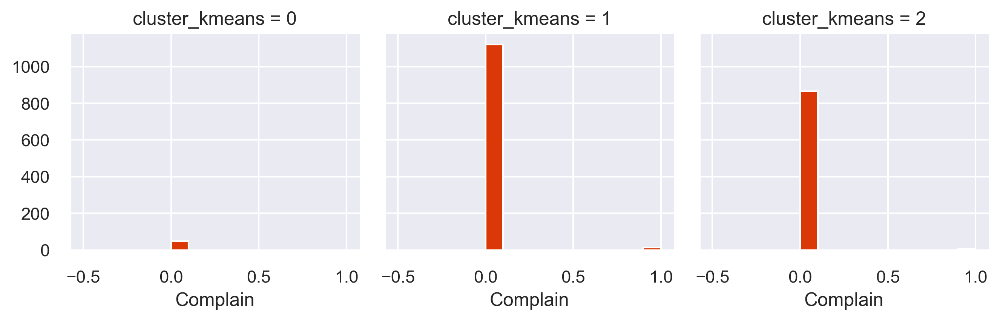

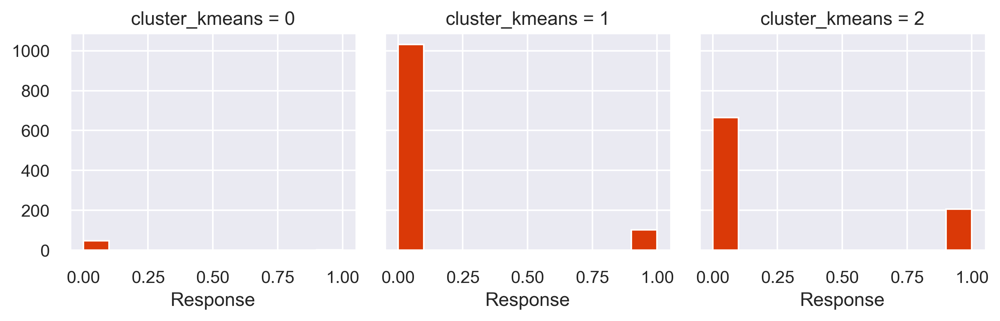

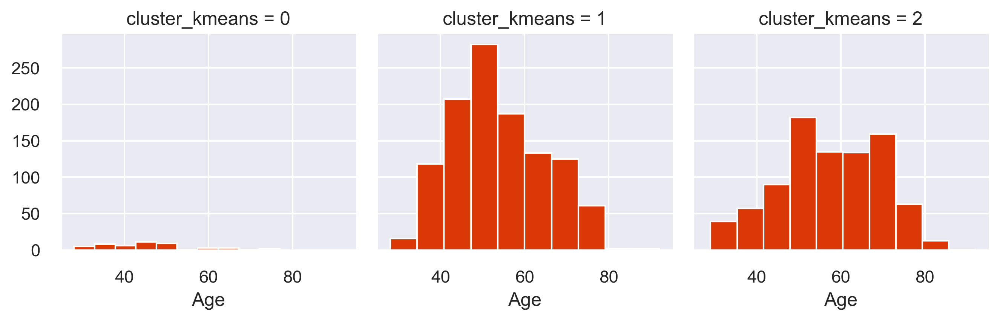

...

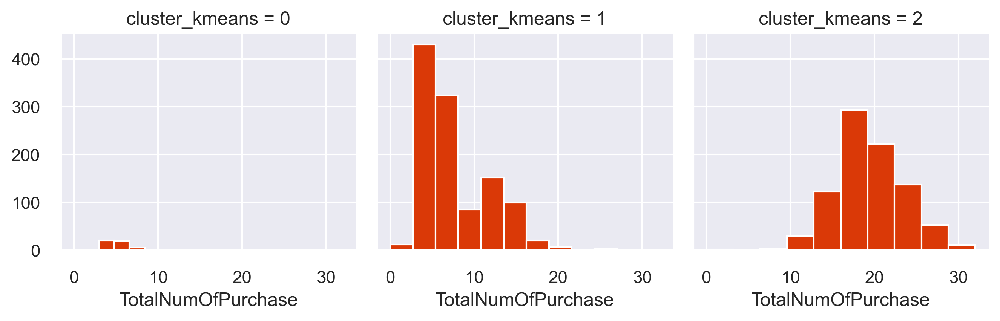

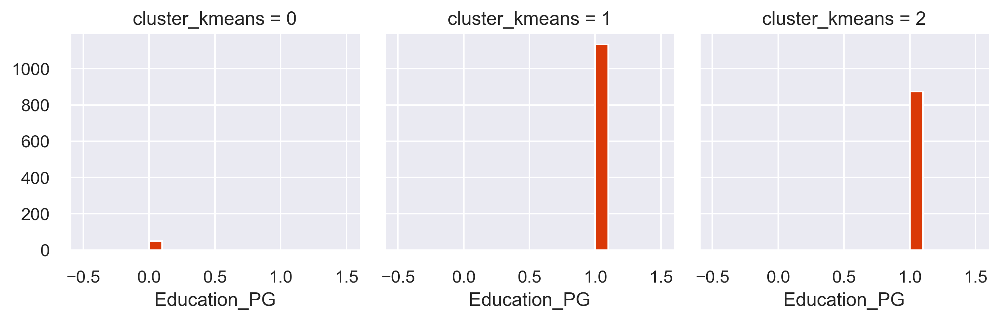

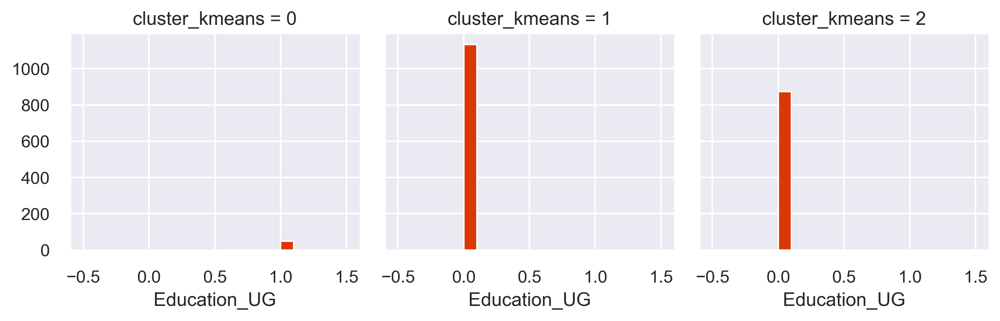

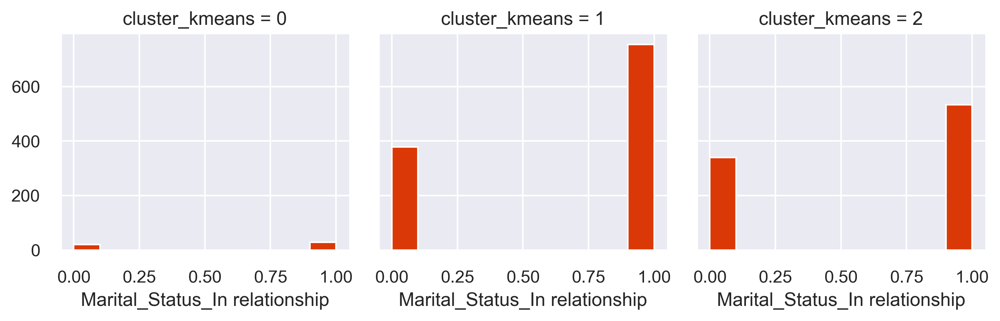

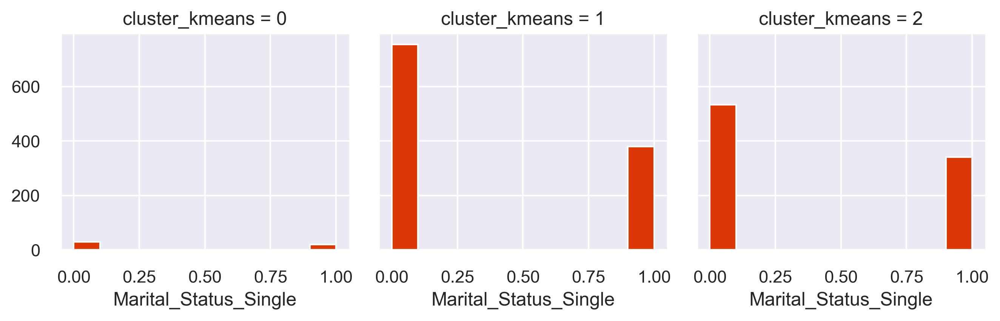

In [90]:
for c in df_kmeans.drop(['cluster_kmeans'],axis=1):
    grid= sns.FacetGrid(df_kmeans, col='cluster_kmeans')
    grid= grid.map(plt.hist, c)
plt.show()

In [91]:
X = df_kmeans.drop(['cluster_kmeans'],axis=1)
y= df_kmeans[['cluster_kmeans']]
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33)

In [92]:
# decision tree 
from sklearn.tree import DecisionTreeClassifier
model_kmeans = DecisionTreeClassifier(criterion="entropy")
model_kmeans.fit(X_train, y_train)
y_pred_kmeans = model_kmeans.predict(X_test)
y_pred_kmeans

array([1, 2, 1, 1, 1, 2, 2, 1, 1, 1, 1, 2, 1, 2, 1, 1, 2, 2, 1, 2, 1, 2,
       1, 2, 2, 2, 1, 1, 1, 1, 2, 1, 1, 2, 2, 1, 2, 1, 1, 2, 1, 1, 1, 2,
       1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 2, 2, 1, 1, 2, 1, 1, 2, 1, 1, 2, 2,
       1, 2, 1, 1, 1, 2, 1, 1, 1, 2, 0, 1, 1, 1, 2, 1, 2, 2, 2, 1, 1, 2,
       1, 2, 2, 2, 2, 1, 1, 1, 1, 2, 2, 1, 1, 1, 2, 2, 1, 2, 2, 2, 1, 1,
       2, 2, 2, 2, 1, 2, 1, 1, 1, 1, 1, 2, 2, 1, 2, 1, 2, 1, 2, 1, 1, 1,
       1, 1, 1, 1, 1, 2, 1, 2, 2, 2, 2, 1, 2, 2, 1, 2, 2, 2, 2, 1, 2, 1,
       2, 1, 1, 1, 1, 2, 2, 2, 1, 1, 2, 2, 2, 1, 1, 2, 2, 1, 2, 1, 1, 2,
       2, 1, 2, 1, 2, 2, 2, 1, 1, 1, 1, 2, 1, 2, 2, 1, 1, 1, 1, 2, 2, 2,
       1, 1, 1, 1, 0, 1, 2, 1, 1, 1, 1, 1, 2, 1, 2, 2, 1, 1, 1, 1, 2, 1,
       1, 2, 1, 1, 1, 1, 1, 2, 2, 1, 1, 2, 2, 2, 1, 2, 1, 0, 1, 1, 2, 2,
       2, 2, 1, 2, 2, 1, 1, 2, 0, 1, 1, 1, 1, 2, 1, 1, 0, 1, 2, 1, 1, 1,
       1, 2, 1, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1,
       2, 2, 1, 2, 2, 2, 0, 1, 1, 1, 1, 1, 2, 1, 1,

In [93]:
from sklearn.metrics import confusion_matrix, classification_report

# Assuming y_test and y_pred are already defined
print(confusion_matrix(y_test, y_pred_kmeans))
print(classification_report(y_test, y_pred_kmeans))

[[ 17   0   0]
 [  0 360  14]
 [  0  14 274]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        17
           1       0.96      0.96      0.96       374
           2       0.95      0.95      0.95       288

    accuracy                           0.96       679
   macro avg       0.97      0.97      0.97       679
weighted avg       0.96      0.96      0.96       679



In [94]:
#classificaficatilon for dbscan

In [95]:
df_dbscan.head()

,Income,Recency,Complain,Response,Age,Days_Since_Enrollment,Kids,Total_expense,TotalAcceptedCmp,TotalNumOfPurchase,Education_PG,Education_UG,Marital_Status_In relationship,Marital_Status_Single,Cluster_db
0,58138.0,58,0,1,67,4356,0,1441,0,22,1,0,0,1,0
1,46344.0,38,0,0,70,3806,2,20,0,4,1,0,0,1,1
2,71613.0,26,0,0,59,4005,0,713,0,20,1,0,1,0,2
3,26646.0,26,0,0,40,3832,1,45,0,6,1,0,1,0,2
4,58293.0,94,0,0,43,3854,1,380,0,14,1,0,1,0,2


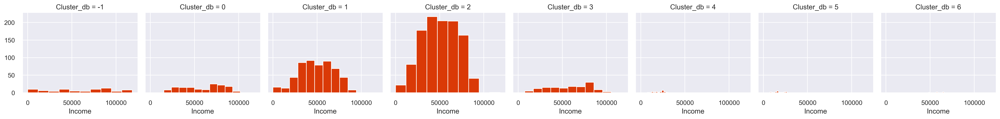

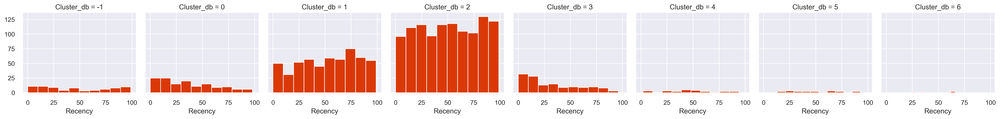

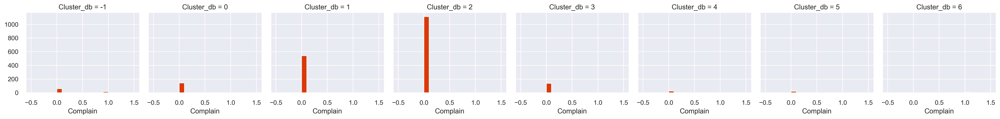

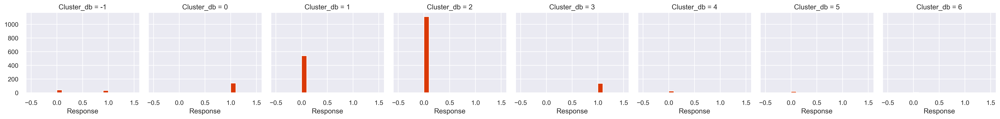

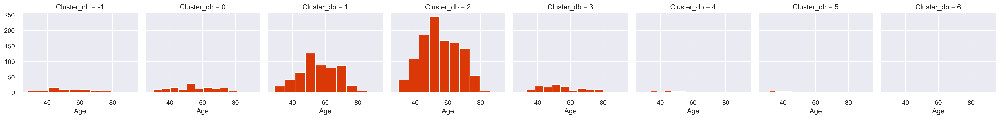

...

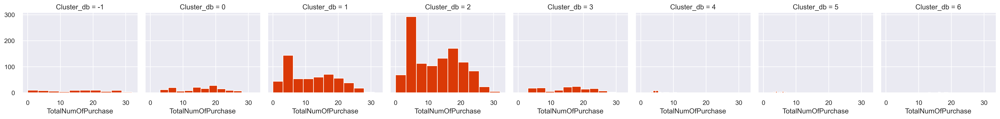

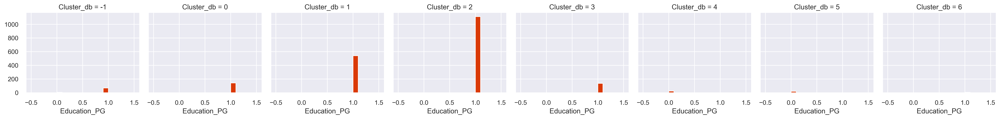

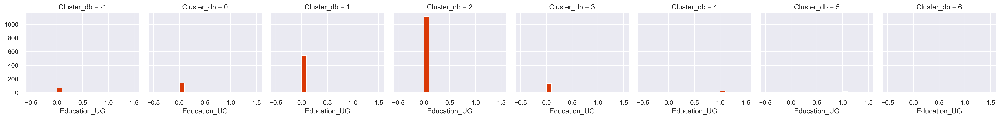

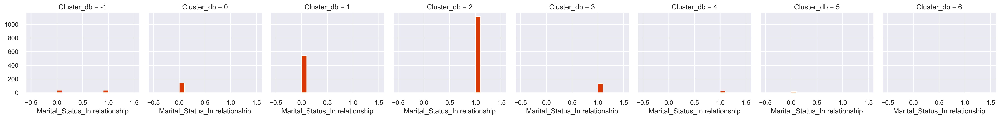

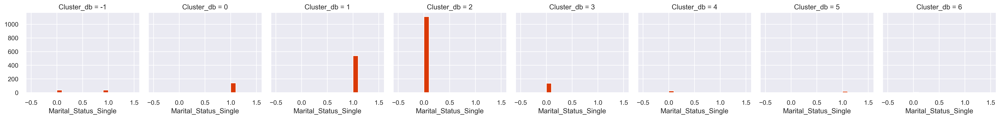

In [96]:
for c in df_dbscan.drop(['Cluster_db'],axis=1):
    grid= sns.FacetGrid(df_dbscan, col='Cluster_db')
    grid= grid.map(plt.hist, c)
plt.show()

In [97]:
X = df_dbscan.drop(['Cluster_db'],axis=1)
y= df_dbscan[['Cluster_db']]
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33)

In [98]:
# decision tree 
from sklearn.tree import DecisionTreeClassifier
model_dbscan = DecisionTreeClassifier(criterion="entropy")
model_dbscan.fit(X_train, y_train)
y_pred_dbscan = model_dbscan.predict(X_test)
y_pred_dbscan

array([ 2,  2,  3,  1,  3,  1,  4,  1,  2,  2,  2,  1,  2,  2,  2,  2,  1,
        2,  3,  1,  2,  1,  2,  2,  2,  3,  3,  2,  2,  1,  2,  2,  2,  2,
        2,  2,  2,  0,  2,  1,  1,  2,  2,  0,  2,  5,  2,  3,  2,  2,  2,
        3,  1,  1,  0,  2,  2,  1,  1,  2,  2,  2,  2,  1,  0,  2,  2,  2,
        2,  1,  1,  2,  1,  0,  2,  5,  2,  2,  2,  1,  2,  0,  2,  2,  2,
        2,  2,  2,  2,  3,  2,  1,  2,  2,  0, -1,  2,  1,  2,  2,  3,  1,
        4,  2,  2,  2,  2,  1,  2,  1,  2,  2,  2,  1,  2,  1,  1,  2,  1,
        2,  2, -1,  3,  1,  1,  1,  1,  1,  2,  2,  2,  2,  2,  2,  1,  2,
        1,  2,  2,  1,  2,  2,  2,  2,  2,  2,  1,  0,  2,  1,  2,  2,  2,
        1,  0,  3,  0,  2,  1,  2,  4,  2,  2,  2,  0,  3,  2,  2,  2,  0,
        2,  0,  2,  2,  2,  2,  2,  2,  2,  2,  1,  2,  3,  3,  3,  3,  2,
        2,  1,  2,  2,  2,  2,  6,  2,  1,  1,  3,  1,  2,  2,  2,  3,  2,
        2,  2, -1,  2,  2,  1,  1,  2,  0,  6,  2,  2,  2,  2,  1,  0,  2,
        1,  2,  1,  1,  2

In [99]:
from sklearn.metrics import confusion_matrix, classification_report

# Assuming y_test and y_pred are already defined
print(confusion_matrix(y_test, y_pred_dbscan))
print(classification_report(y_test, y_pred_dbscan))

[[ 10   7   1   2   2   0   0   1]
 [  1  40   0   0   0   0   0   0]
 [  0   0 182   0   0   0   0   0]
 [  2   0   0 370   0   0   0   0]
 [  3   0   0   0  44   0   0   0]
 [  0   0   0   0   0   7   0   0]
 [  2   0   0   0   0   0   3   0]
 [  0   0   0   0   0   0   0   2]]
              precision    recall  f1-score   support

          -1       0.56      0.43      0.49        23
           0       0.85      0.98      0.91        41
           1       0.99      1.00      1.00       182
           2       0.99      0.99      0.99       372
           3       0.96      0.94      0.95        47
           4       1.00      1.00      1.00         7
           5       1.00      0.60      0.75         5
           6       0.67      1.00      0.80         2

    accuracy                           0.97       679
   macro avg       0.88      0.87      0.86       679
weighted avg       0.97      0.97      0.97       679



In [100]:
import pickle

# Save the trained model
with open('decision_tree_model.pkl', 'wb') as model_file:
    pickle.dump(model_kmeans, model_file)

In [101]:
df_kmeans.head()

,Income,Recency,Complain,Response,Age,Days_Since_Enrollment,Kids,Total_expense,TotalAcceptedCmp,TotalNumOfPurchase,Education_PG,Education_UG,Marital_Status_In relationship,Marital_Status_Single,cluster_kmeans
0,58138.0,58,0,1,67,4356,0,1441,0,22,1,0,0,1,2
1,46344.0,38,0,0,70,3806,2,20,0,4,1,0,0,1,1
2,71613.0,26,0,0,59,4005,0,713,0,20,1,0,1,0,2
3,26646.0,26,0,0,40,3832,1,45,0,6,1,0,1,0,1
4,58293.0,94,0,0,43,3854,1,380,0,14,1,0,1,0,1
